## **Problem Statement**
# Forecast Gold Prices
### Business Objective:
#### Data provided is related to gold prices. The objective is to understand the underlying structure in your dataset and come up with a suitable forecasting model which can effectively forecast gold prices for next 30 days.
#### This forecast model will be used by gold exporting and gold importing companies to understand the metal price movements and accordingly set their revenue expectations.


## 1. Introduction:<a class="anchor" id="1"></a>
### What is Forecasting a Time Series?
Time series forecasting is one of the most applied data science techniques in business, finance, supply chain management, production and inventory planning. Many prediction problems involve a time component and thus require extrapolation of time series data, or time series forecasting. Time series forecasting is also an important area of machine learning (ML) and can be cast as a supervised learning problem. ML methods such as Regression, Neural Networks, Support Vector Machines, Random Forests and XGBoost — can be applied to it. Forecasting involves taking models fit on historical data and using them to predict future observations.

Time series forecasting means to forecast or to predict the future value over a period of time. It entails developing models based on previous data and applying them to make observations and guide future strategic decisions.

The future is forecast or estimated based on what has already happened. Time series adds a time order dependence between observations. This dependence is both a constraint and a structure that provides a source of additional information. Before we discuss time series forecasting methods, let’s define time series forecasting more closely.

Time series forecasting is a technique for the prediction of events through a sequence of time. It predicts future events by analyzing the trends of the past, on the assumption that future trends will hold similar to historical trends. It is used across many fields of study in various applications including:

+ Astronomy
+ Business planning
+ Control engineering
+ Earthquake prediction
+ Econometrics
+ Mathematical finance
+ Pattern recognition
+ Resources allocation
+ Signal processing
+ Statistics
+ Weather forecasting

Time series forecasting starts with a historical time series. Analysts examine the historical data and check for patterns of time decomposition, such as trends, seasonal patterns, cyclic patterns and regularity. Many areas within organizations including marketing, finance and sales use some form of time series forecasting to evaluate probable technical costs and consumer demand. Models for time series data can have many forms and represent different stochastic processes.




In [1]:
!pip install dataprep

In [2]:
!pip install statsmodels --upgrade

In [136]:
# Importing Libraries
import numpy as np
import pandas as pd
from scipy.stats import boxcox
from pandas.plotting import lag_plot
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from pandas import DataFrame
from pandas import Grouper
from math import sqrt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing # SES
from statsmodels.tsa.holtwinters import Holt # Holts Exponential Smoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
from collections import Counter
sns.set_style('darkgrid')
from dataprep.eda import plot, plot_correlation, plot_missing, create_report
import plotly.express as px
from plotly.offline import plot as off
import plotly.figure_factory as ff
import plotly.io as pio
from sklearn.preprocessing import StandardScaler, LabelEncoder, MinMaxScaler, scale
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV, KFold, StratifiedKFold, cross_val_score, \
                                    train_test_split, RandomizedSearchCV
import warnings
warnings.filterwarnings('ignore')
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_regression

import matplotlib.pyplot as plt
from scalecast.Forecaster import Forecaster


from prophet import Prophet
from prophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')

In [137]:
# Import Dataset
df = pd.read_csv('Gold_data.csv')
print('Shape of the data',df.shape)
df.head(10)

Shape of the data (2182, 2)


,date,price
0,2016-01-01,2252.60
1,2016-01-02,2454.50
2,2016-01-03,2708.10
3,2016-01-04,2577.80
4,2016-01-05,2597.75
5,2016-01-06,2617.70
6,2016-01-07,2903.80
7,2016-01-08,2887.80
8,2016-01-09,2813.80
9,2016-01-10,2786.80


## 3. Data Exploration


Before doing anything else with the data let's see if there are any null values (missing data) in any of the columns.

In [138]:
df.isnull().any()

date     False
price    False
dtype: bool

In [139]:
df.isnull().sum()

date     0
price    0
dtype: int64

<AxesSubplot:>

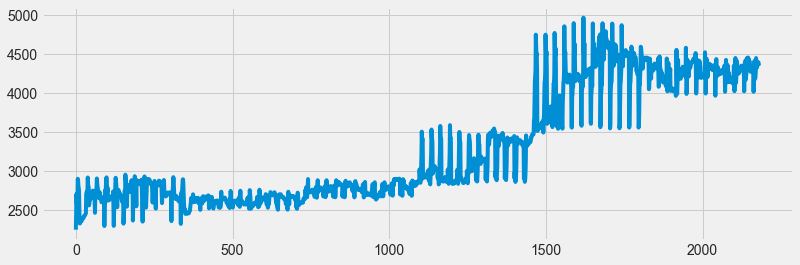

In [140]:
df.price.plot(figsize=(12,4))

- We have no missing data so all the entries are valid for use.

- Now we can check the column names to get a better understanding of what features we will be basing our regression on.

### 3.1 Descriptive Analysis

In [141]:
df.shape

(2182, 2)

In [142]:
#Checking the data types
df.dtypes

date      object
price    float64
dtype: object

In [143]:
#Unique values for every feature
df.nunique()

date     2182
price    1876
dtype: int64

In [144]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2182 entries, 0 to 2181
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    2182 non-null   object 
 1   price   2182 non-null   float64
dtypes: float64(1), object(1)
memory usage: 34.2+ KB


In [145]:
df.date= pd.to_datetime(df.date)

In [146]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2182 entries, 0 to 2181
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    2182 non-null   datetime64[ns]
 1   price   2182 non-null   float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 34.2 KB


In [147]:
df[df.duplicated()].shape

(0, 2)

In [148]:
df[df.duplicated()]

,date,price


In [149]:
df.describe()

,price
count,2182.000000
mean,3284.450046
std,719.564434
min,2252.600000
25%,2697.020000
50%,2879.800000
75%,4147.325000
max,4966.300000


### Feature Engineering

#### Making the Date as DateTime index for the Dataframe

In [150]:
df1 = df.copy()
df1.set_index('date',inplace=True)
df1.index.year

Int64Index([2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016, 2016,
            ...
            2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021, 2021],
           dtype='int64', name='date', length=2182)

In [151]:
df1.head()

,price
date,
2016-01-01,2252.60
2016-01-02,2454.50
2016-01-03,2708.10
2016-01-04,2577.80
2016-01-05,2597.75


#### Separating Month and Year into Separate Column for Visualization and removing meaningful insight of the data

In [152]:
df["date"] = pd.to_datetime(df.date,format="%b-%y")
df["month"] = df.date.dt.strftime("%b") # month extraction
df["year"] = df.date.dt.strftime("%Y") # year extraction
df.head(10)

,date,price,month,year
0,2016-01-01,2252.60,Jan,2016
1,2016-01-02,2454.50,Jan,2016
2,2016-01-03,2708.10,Jan,2016
3,2016-01-04,2577.80,Jan,2016
4,2016-01-05,2597.75,Jan,2016
5,2016-01-06,2617.70,Jan,2016
6,2016-01-07,2903.80,Jan,2016
7,2016-01-08,2887.80,Jan,2016
8,2016-01-09,2813.80,Jan,2016
9,2016-01-10,2786.80,Jan,2016


### Data Visualization

<AxesSubplot:xlabel='month', ylabel='year'>

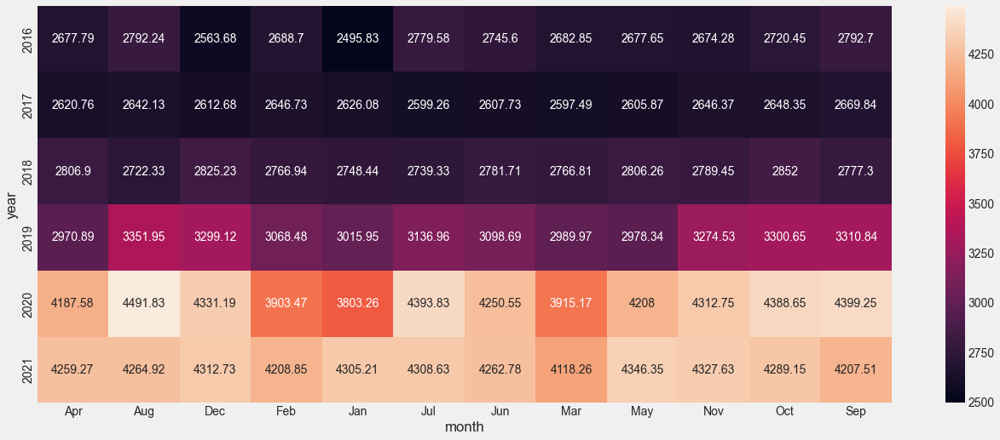

In [153]:
plt.figure(figsize=(20,8))
heatmap_y_month = pd.pivot_table(data=df,values="price",index="year",columns="month",aggfunc="mean",fill_value=0)
sns.heatmap(heatmap_y_month,annot=True,fmt="g") #fmt is format of the grid values

In [154]:
heatmap_y_month

month,Apr,Aug,Dec,Feb,Jan,Jul,Jun,Mar,May,Nov,Oct,Sep
year,,,,,,,,,,,,
2016,2677.790000,2792.240323,2563.683333,2688.703448,2495.832258,2779.582258,2745.596667,2682.854839,2677.650000,2674.280000,2720.454839,2792.705000
2017,2620.758333,2642.133871,2612.683871,2646.730357,2626.077957,2599.256452,2607.733333,2597.485484,2605.872581,2646.371667,2648.345161,2669.835000
2018,2806.903333,2722.327419,2825.232258,2766.942857,2748.438710,2739.325806,2781.715000,2766.806452,2806.258065,2789.446667,2851.996774,2777.303333
2019,2970.890000,3351.954839,3299.116129,3068.482143,3015.954839,3136.961290,3098.686667,2989.967742,2978.335484,3274.526667,3300.645161,3310.843333
2020,4187.580000,4491.829032,4331.187097,3903.472414,3803.264516,4393.832258,4250.550000,3915.170968,4208.000000,4312.750000,4388.651613,4399.250000
2021,4259.273333,4264.919355,4312.733333,4208.853571,4305.209677,4308.632258,4262.783333,4118.264516,4346.348387,4327.633333,4289.148387,4207.506667


#### Line plot

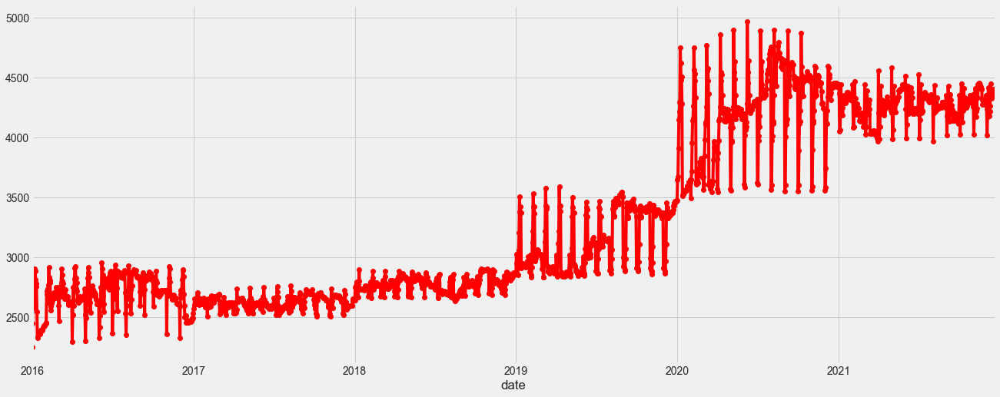

In [155]:
df1['price'].plot(figsize=(20, 8),color='red',marker='o')
plt.show()

##### Observation: 
1. We can see that there is an increasing Trend. So, Trend is not constant.
2. Variance is also not constant.

Hence the time serise is not stationary.

Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


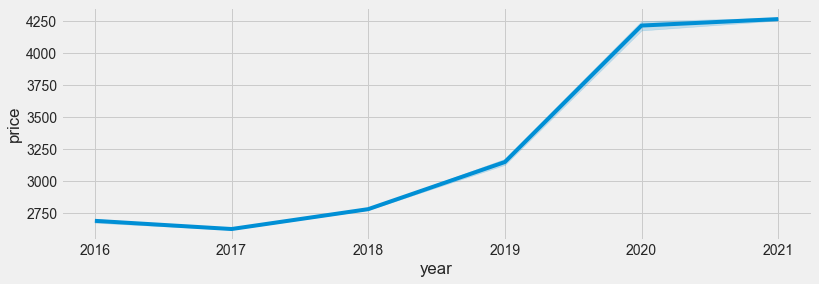

In [156]:
plt.figure(figsize=(12,4))
sns.lineplot(x="year",y="price",data=df)
warnings.filterwarnings('ignore')

#### Box Plot of Each Year by Monthly Intervals

<AxesSubplot:xlabel='year', ylabel='price'>

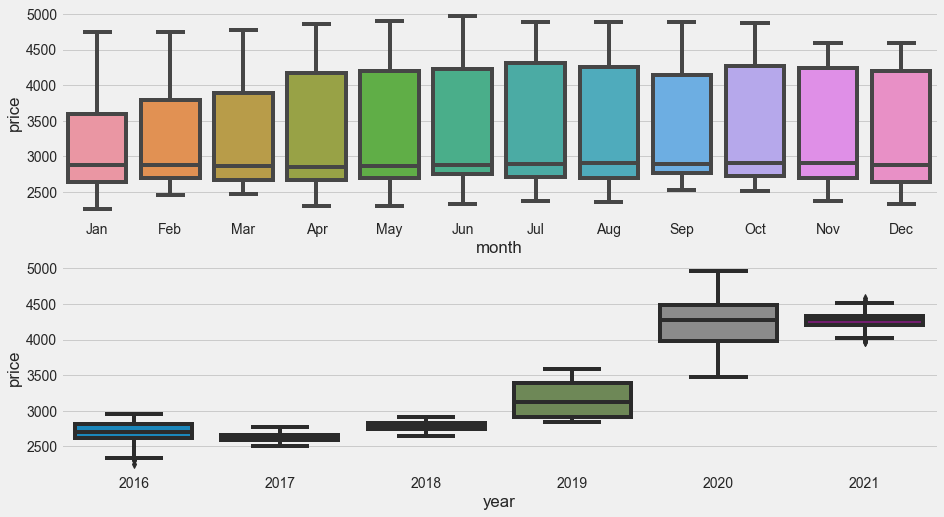

In [157]:
# Boxplot for ever
plt.figure(figsize=(14,8))
plt.subplot(211)
sns.boxplot(x="month",y="price",data=df)
plt.subplot(212)
sns.boxplot(x="year",y="price",data=df)

#### Histogram and Density Plots

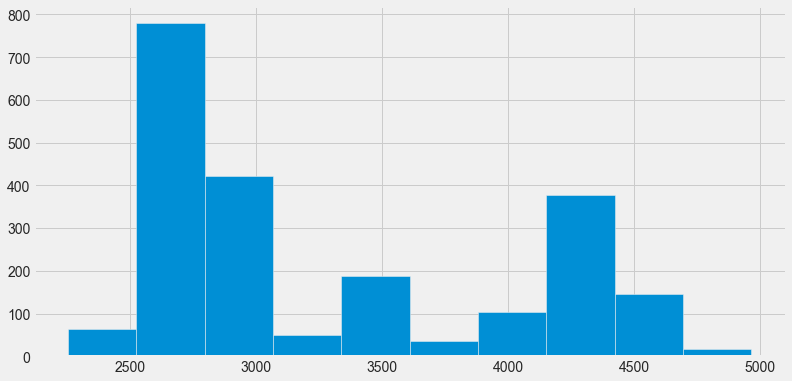

In [158]:
df.price.hist(figsize=(12,6))
plt.show()

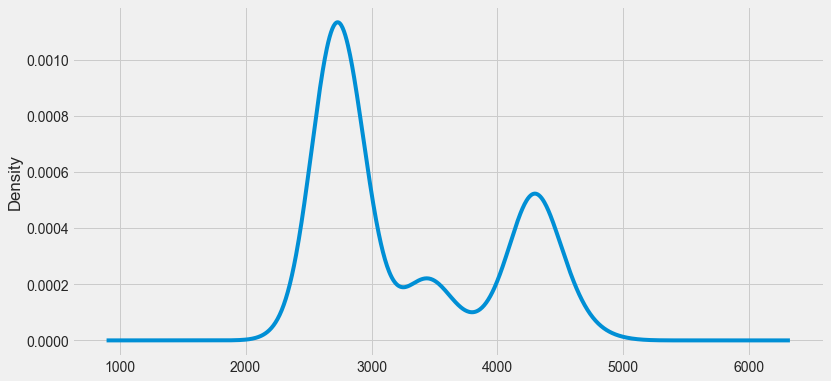

In [159]:
# create a density plot
df.price.plot(kind='kde', figsize=(12,6))
plt.show()

#### Lag plot

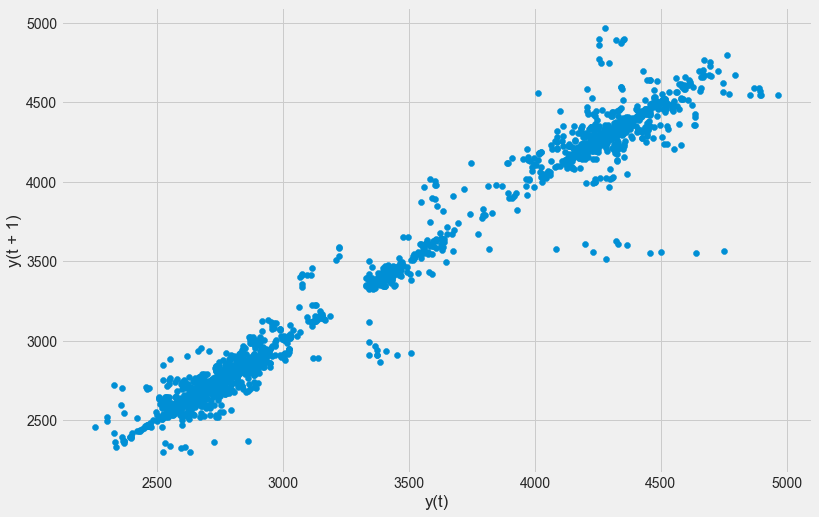

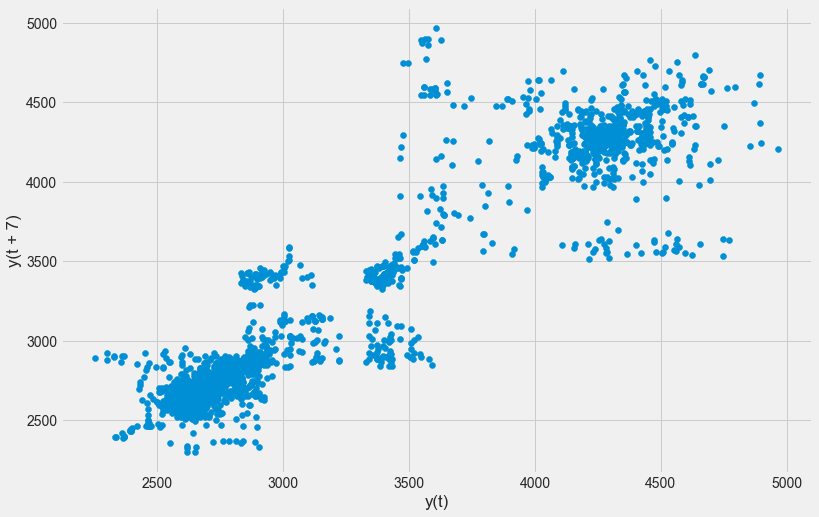

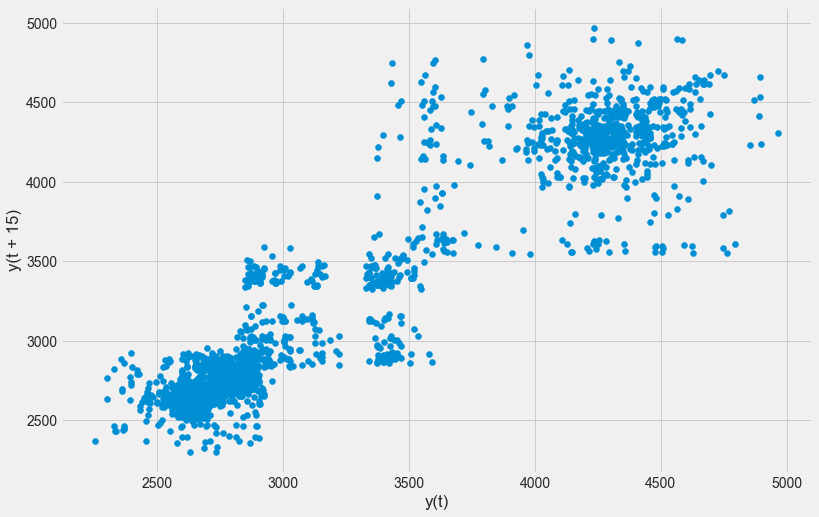

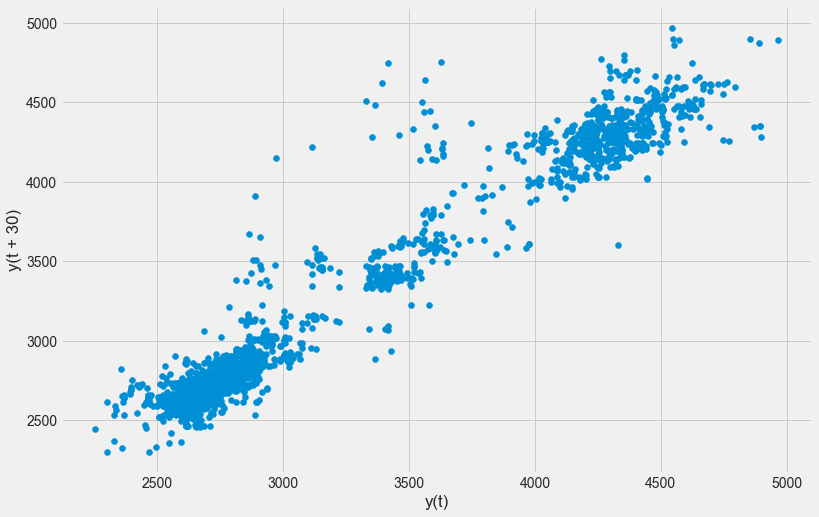

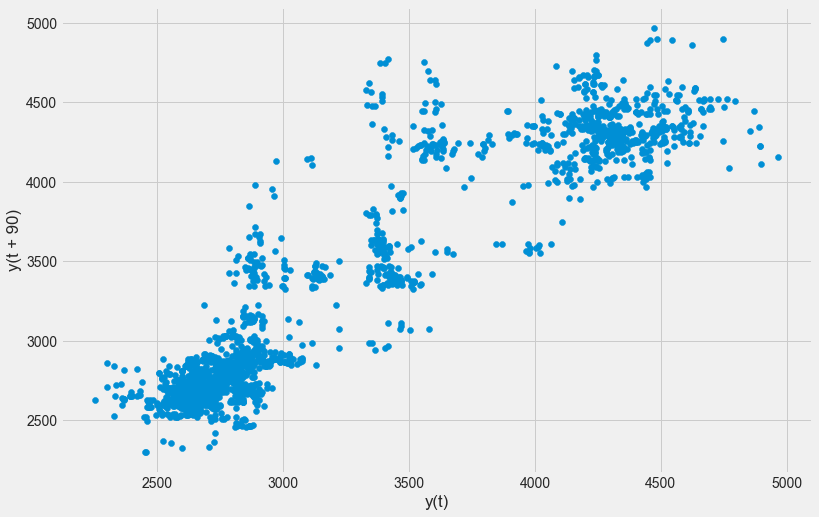

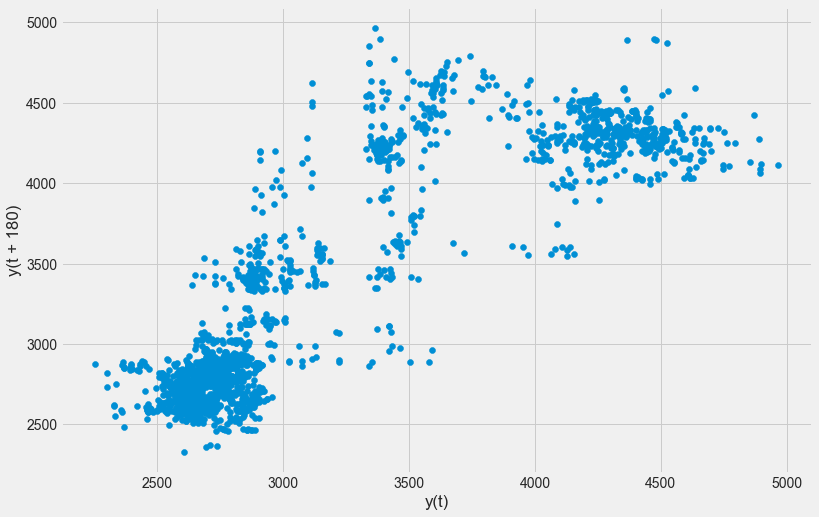

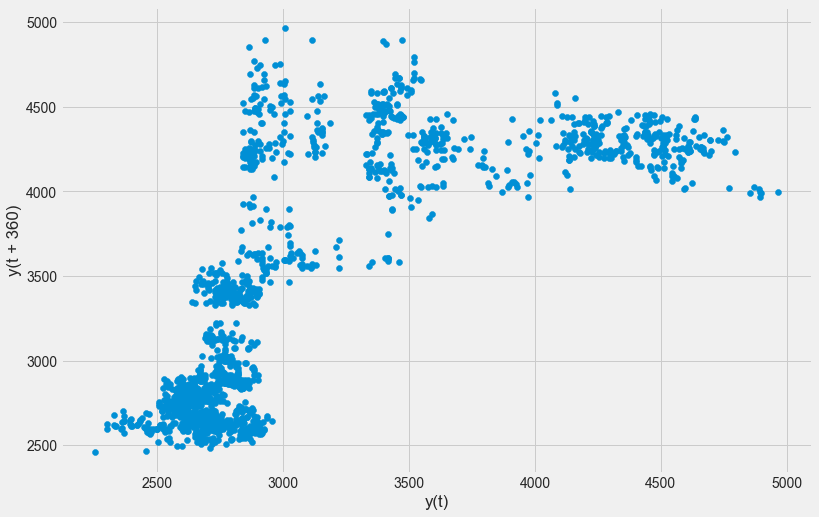

In [160]:
  
# create a scatter plot
for i in [1, 7, 15, 30, 90, 180, 360]:
    plt.figure(figsize=(12,8))
    lag_plot(df.price, lag=i)
    plt.show()

### Moving Average

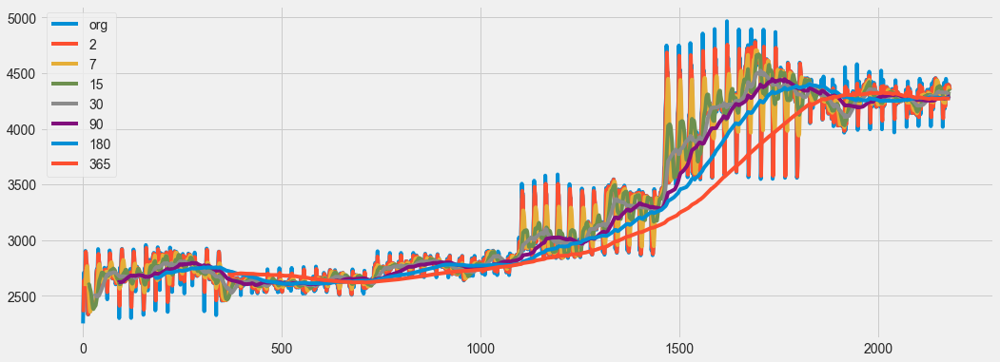

In [161]:
plt.figure(figsize=(16,6))
df.price.plot(label="org")
lis=[2,7,15,30,90,180,365]

for i in lis:
    df["price"].rolling(i).mean().plot(label=str(i))
plt.legend(loc='best')

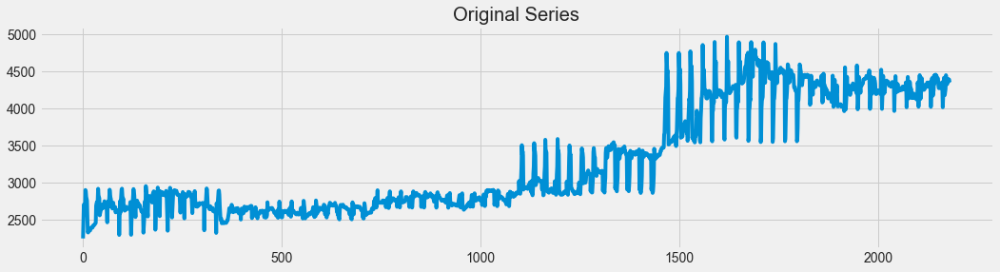

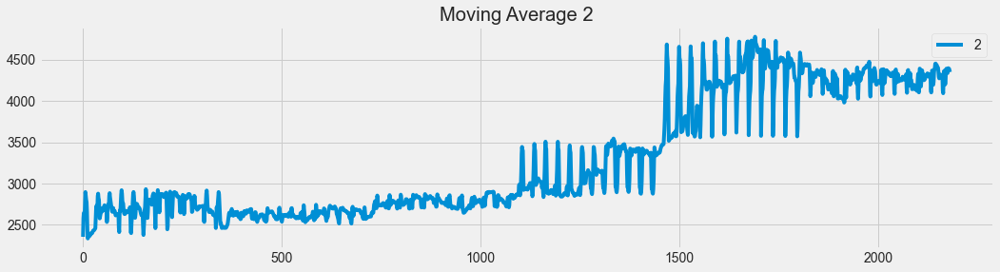

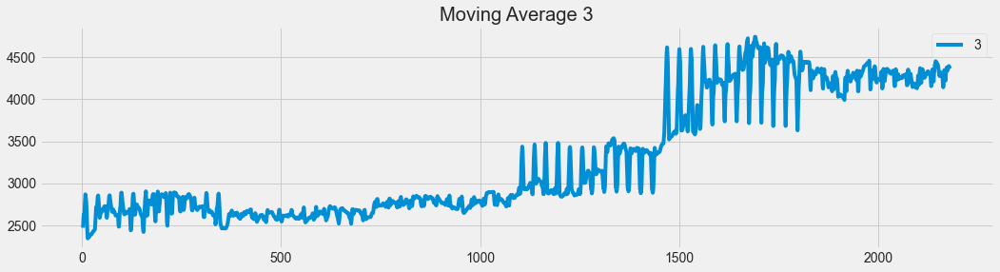

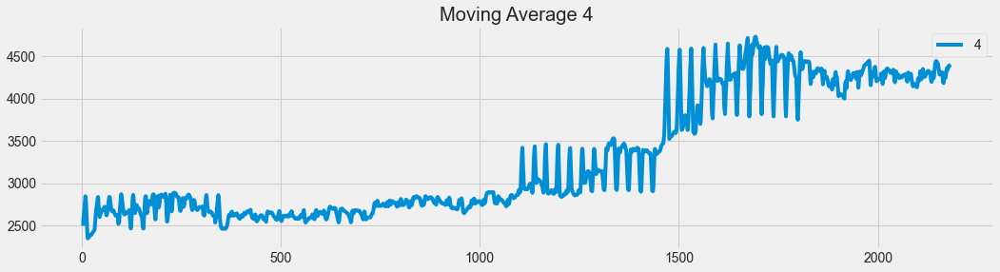

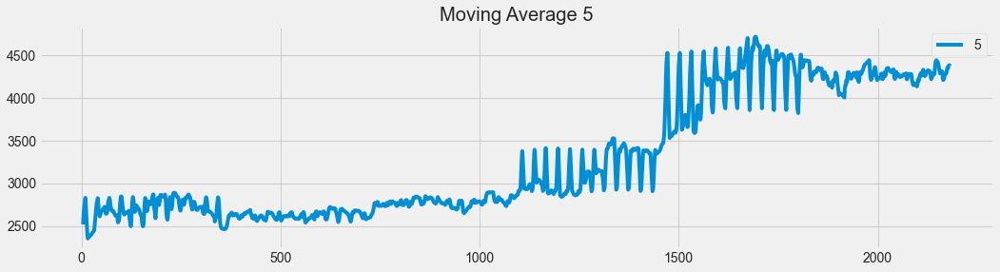

...

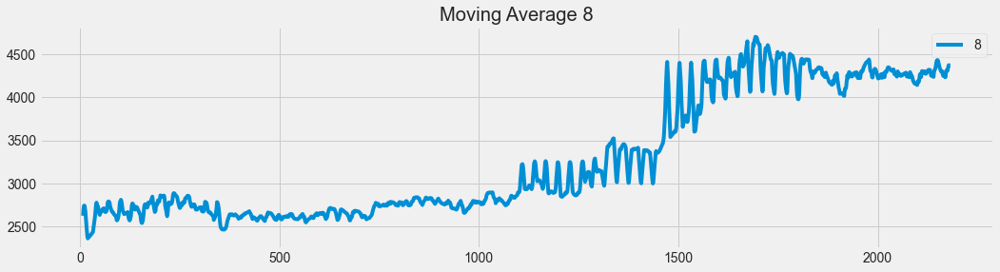

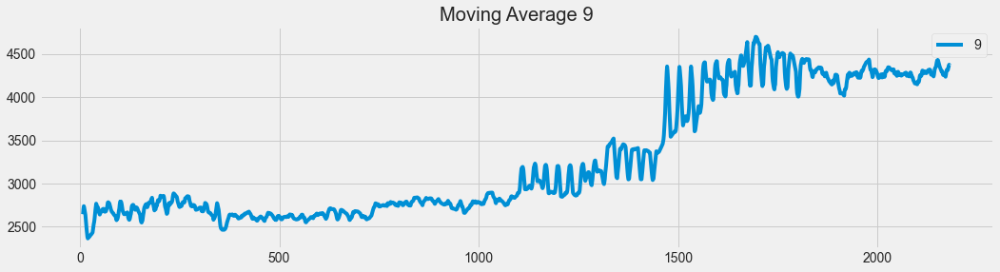

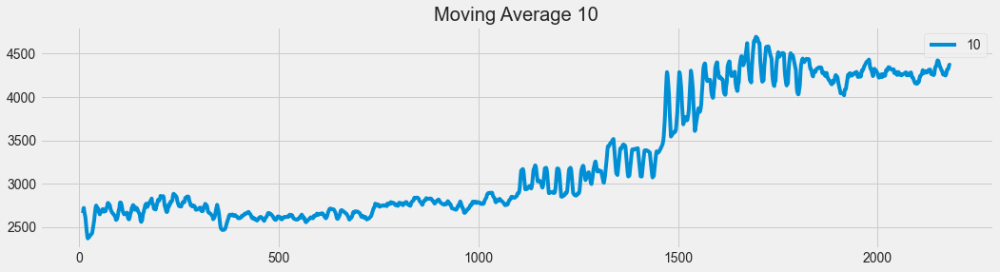

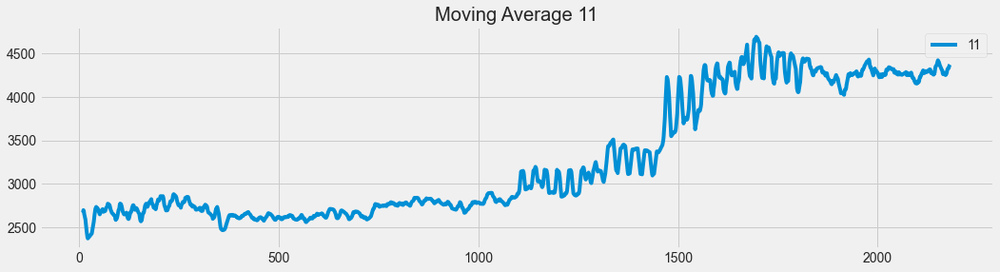

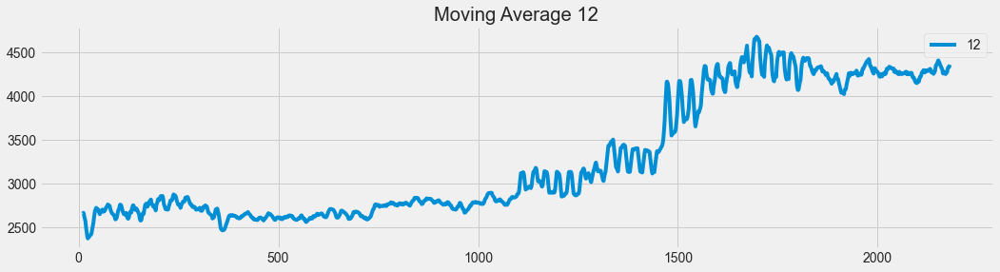

In [162]:
plt.figure(figsize=(16,4))
df.price.plot(label="org")
plt.title("Original Series")
for i in range(2,13):
    plt.figure(figsize=(16,4))
    df["price"].rolling(i).mean().plot(label=str(i))
    plt.title("Moving Average "+str(i))
    plt.legend(loc='best')
    plt.show()

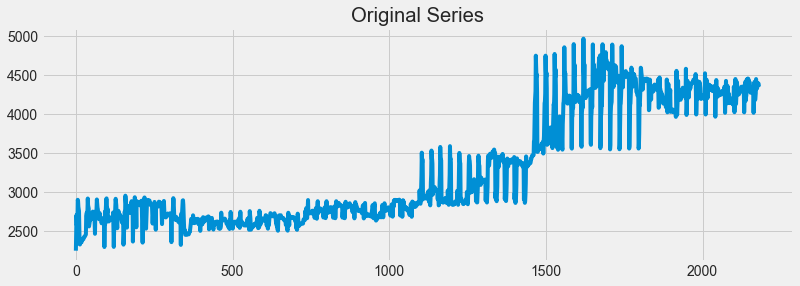

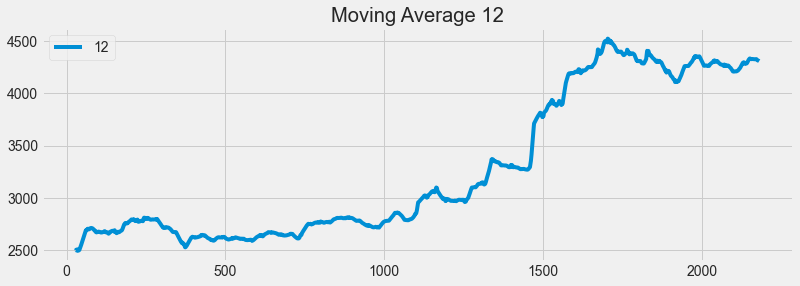

In [163]:
plt.figure(figsize=(12,4))
df.price.plot(label="org")
plt.title("Original Series")
plt.figure(figsize=(12,4))
df["price"].rolling(30).mean().plot(label=str(12))
plt.title("Moving Average "+str(12))
plt.legend(loc='best')
plt.show()

In [164]:
df

,date,price,month,year
0,2016-01-01,2252.60,Jan,2016
1,2016-01-02,2454.50,Jan,2016
2,2016-01-03,2708.10,Jan,2016
3,2016-01-04,2577.80,Jan,2016
4,2016-01-05,2597.75,Jan,2016
...,...,...,...,...
2177,2021-12-17,4394.40,Dec,2021
2178,2021-12-18,4389.50,Dec,2021
2179,2021-12-19,4389.50,Dec,2021
2180,2021-12-20,4354.10,Dec,2021


### Time series decomposition plot 

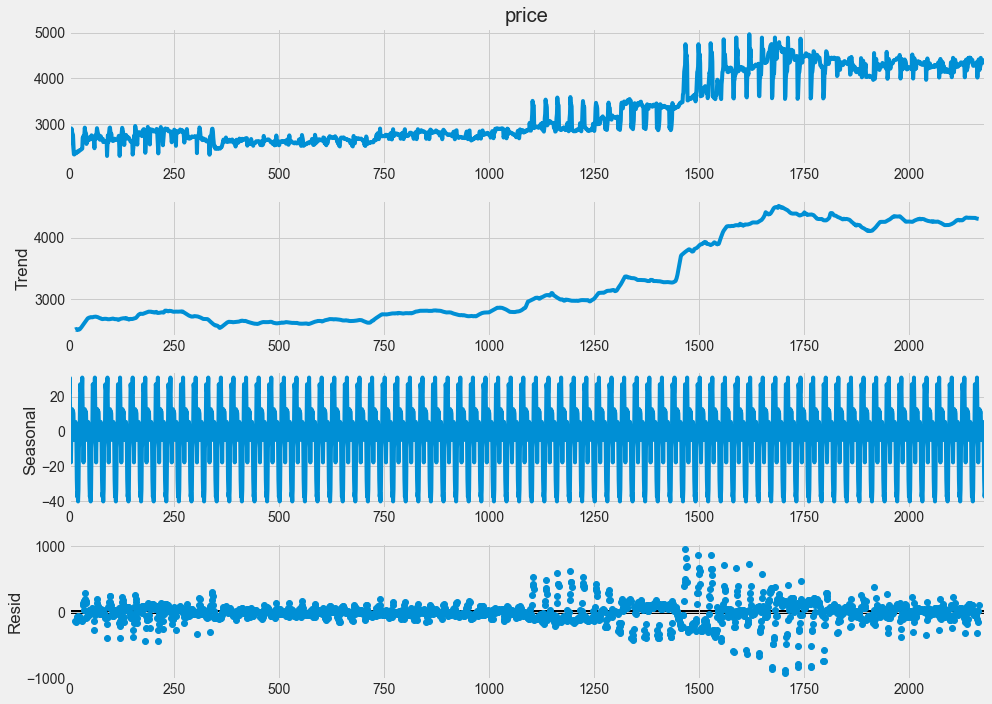

In [165]:
decompose_ts_add = seasonal_decompose(df.price,period=30)
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

#### Autocorrelation Function (ACF)
The autocorrelation function (ACF) is a statistical technique that we can use to identify how correlated the values in a time series are with each other. The ACF plots the correlation coefficient against the lag, which is measured in terms of a number of periods or units. A lag corresponds to a certain point in time after which we observe the first value in the time series.

The correlation coefficient can range from -1 (a perfect negative relationship) to +1 (a perfect positive relationship). A coefficient of 0 means that there is no relationship between the variables. Also, most often, it is measured either by Pearson’s correlation coefficient or by Spearman’s rank correlation coefficient.

It’s most often used to analyze sequences of numbers from random processes, such as economic or scientific measurements. It can also be used to detect systematic patterns in correlated data sets such as securities prices or climate measurements. Usually, we can calculate the ACF using statistical packages from Python and R or using software such as Excel and SPSS. Below, we can see an example of the ACF plot:

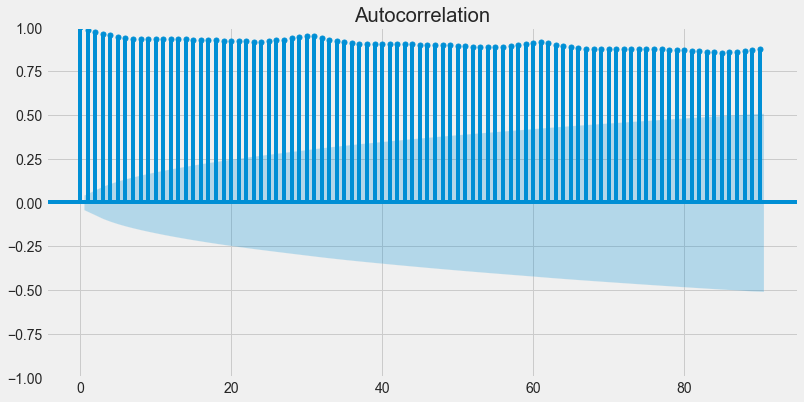

In [166]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,6))
    tsa_plots.plot_acf(df.price,lags=90)
    plt.show()

#### Partial Autocorrelation Function (PACF)
Partial autocorrelation is a statistical measure that captures the correlation between two variables after controlling for the effects of other variables. For example, if we’re regressing a signal S at lag t (S_{t}) with the same signal at lags t-1, t-2 and t-3 (S_{t-1}, S_{t-2}, S_{t-3}), the partial correlation between S_{t} and S_{t-3} is the amount of correlation between S_{t} and S_{t-3} that isn’t explained by their mutual correlations with S_{t-1} and S_{t-2}.

That being said, the way of finding PACF between S_{t} and S_{t-3} is to use regression model

(1) \begin{align*} S_{t} = \phi_{1}S_{t-1} + \phi_{2}S_{t-2} + \phi_{3}S_{t-3} + \epsilon \end{align*}

where  \phi_{1}, \phi_{2} and \phi_{3} are coefficients and \epsilon is error. From the regression formula above, the PACF value between S_{t} and S_{t-3} is the coefficient \pi_{3}. This coefficient will give us direct effect of time-series S_{t-3} to the time-series S_{t} because the effects of S_{t-2} and S_{t-1} are already captured by \phi_{1} and \phi_{2}.

The figure below presents the PACF plot:

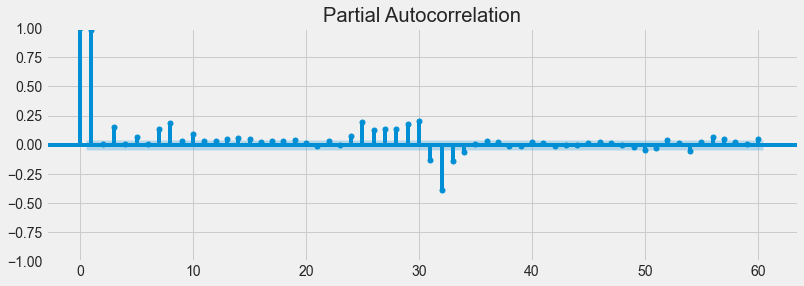

In [167]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,4))
    tsa_plots.plot_pacf(df.price,lags=60)
    plt.show()

#### To summarize, a partial autocorrelation function captures a “direct” correlation between time series and a lagged version of itself.

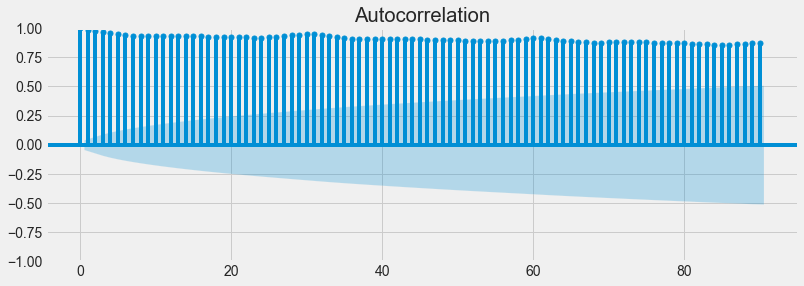

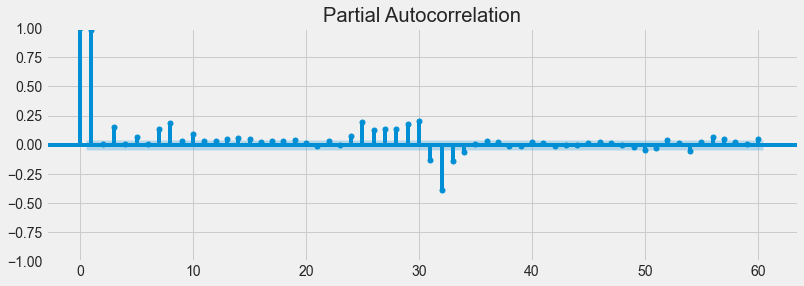

In [168]:
import statsmodels.graphics.tsaplots as tsa_plots
with plt.rc_context():
    plt.rc("figure", figsize=(12,4))
    tsa_plots.plot_acf(df.price,lags=90)
    tsa_plots.plot_pacf(df.price,lags=60)
    plt.show()

In [169]:
visual = df1.copy()
visual.reset_index(inplace=True)
visual['date'] = pd.to_datetime(visual['date'])
visual['year'] = visual['date'].dt.year
visual['month'] = visual['date'].dt.month
visual['week'] = visual['date'].dt.isocalendar().week
visual['quarter'] = visual['date'].dt.quarter
visual['day_of_week'] = visual['date'].dt.day_name()
#visual.drop('date', axis =1 , inplace= True)
visual.head(10)

,date,price,year,month,week,quarter,day_of_week
0,2016-01-01,2252.60,2016,1,53,1,Friday
1,2016-01-02,2454.50,2016,1,53,1,Saturday
2,2016-01-03,2708.10,2016,1,53,1,Sunday
3,2016-01-04,2577.80,2016,1,1,1,Monday
4,2016-01-05,2597.75,2016,1,1,1,Tuesday
5,2016-01-06,2617.70,2016,1,1,1,Wednesday
6,2016-01-07,2903.80,2016,1,1,1,Thursday
7,2016-01-08,2887.80,2016,1,1,1,Friday
8,2016-01-09,2813.80,2016,1,1,1,Saturday
9,2016-01-10,2786.80,2016,1,1,1,Sunday


In [170]:
visual.year.unique()

array([2016, 2017, 2018, 2019, 2020, 2021], dtype=int64)

1) Seasonality
Seasonality is a simple term that means while predicting a time series data there are some months in a particular domain where the output value is at a peak as compared to other months. for example if you observe the data of tours and travels companies of past 3 years then you can see that in November and December the distribution will be very high due to holiday season and festival season. So while forecasting time series data we need to capture this seasonality.

2) Trend
The trend is also one of the important factors which describe that there is certainly increasing or decreasing trend time series, which actually means the value of organization or sales over a period of time and seasonality is increasing or decreasing.

#### Additive Seasonal Decomposition

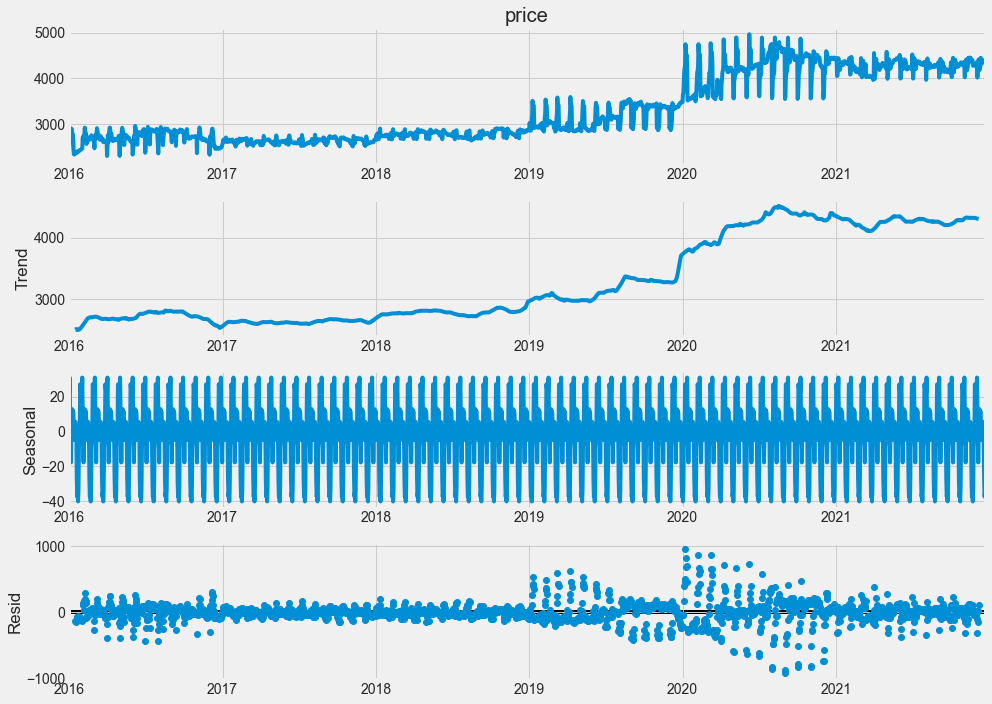

In [171]:
decompose_ts_add = seasonal_decompose(df1.price,period=30, model='additive')
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

#### Observation:-
1. ***Observed*** - Actual data
2. ***Trend*** - Increasing trend.
3. ***Seasonal*** - 
    - Varies from +40 to -30 with the mean 0. 
    - Each cycle represents each month trend.
    - The value in the Y-axis has to be `added` to the Trend plot value to get the actual value of that year. E.g.:- For the year 1950 Nov, the seasonal value is +50 and the trend value is 100. Hence, teh actual value(passengers number) will (seasonal+Trend) value = 50+100 = 150.
4. ***Residual*** - It is the noise pattern of the time series data for each month, which was not captured by the two components - Trend and Seasonality. Residual is the left over after decomposition of the two major components (Trend and Seasonality)

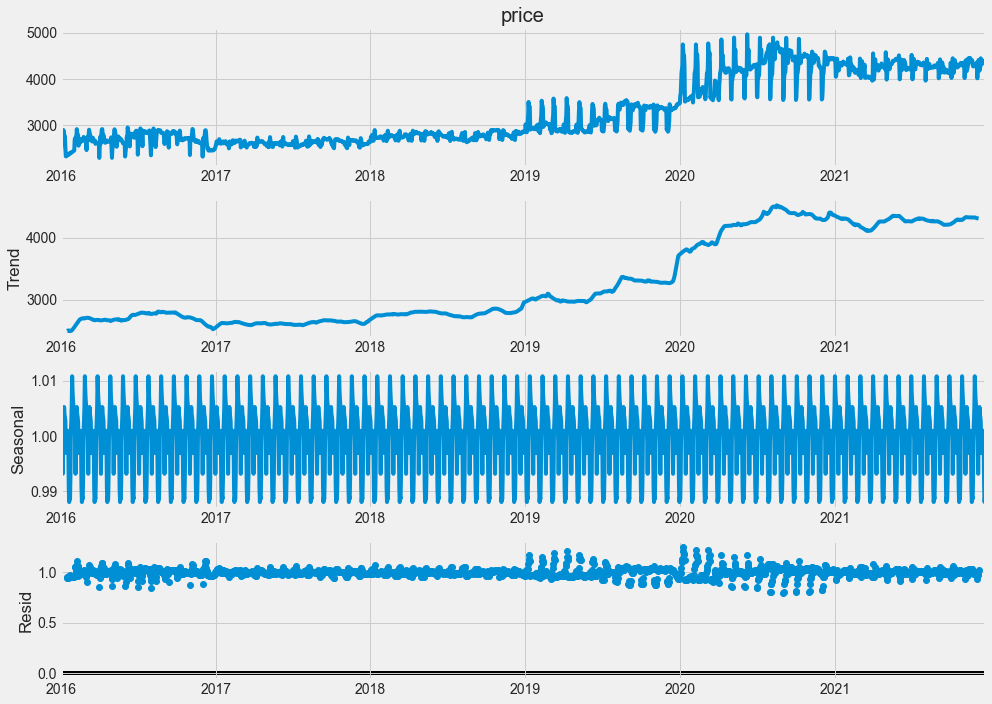

In [172]:
decompose_ts_add = seasonal_decompose(df1.price,period=30, model='multiplicative')
with plt.rc_context():
    plt.rc("figure", figsize=(14,10))
    decompose_ts_add.plot()
    plt.show()

#### Observation:-

***Seasonal*** - 
1. Varies from 0.985 to 1.1 
2. The value in the Y-axis has to be `multiplied` to the Trend plot value to get the actual value of that year. E.g.:- For the year 1950 Nov, the seasonal value is `1.2` and the trend value is `100`. Hence, the actual value(passengers number) will (seasonal X Trend) value = 1.2 X 100 = 120.


### Splitting Train and Test Data
#### Leaving Test Data with 2 months of Time Series

In [251]:
size = -30
train_data = df1[:size]
test_data = df1[size:]

In [252]:
train_data.shape,test_data.shape

((2152, 1), (30, 1))

In [253]:
print('Train:',train_data.index.min(),train_data.index.max(),'\n',
'Test:',test_data.index.min(),test_data.index.max())

Train: 2016-01-01 00:00:00 2021-11-21 00:00:00 
 Test: 2021-11-22 00:00:00 2021-12-21 00:00:00


We are going to forecat for the last two months. 

Last 51 (30+21) records 

<AxesSubplot:xlabel='date'>

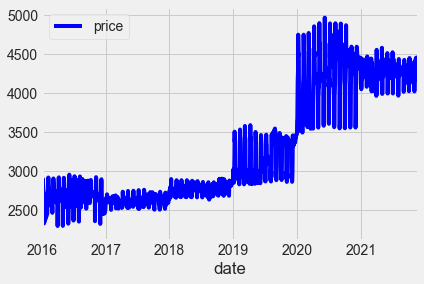

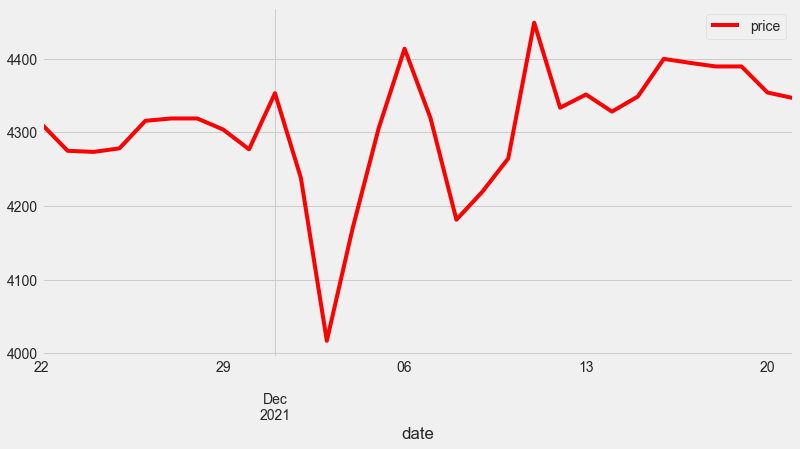

In [254]:
train_data.plot(legend=True,label='TRAIN',color='blue')
test_data.plot(legend=True,label='TEST', figsize=(12,6),color='red')

### Evaluation Metric MAPE

In [255]:
def MAPE(pred,org):
    temp = np.abs((pred-org)/org)*100
    return np.mean(temp)

___
## Exponential Methods
### Simple Exponential Method

#### Using Forecast Attribute

In [257]:
ses_model = SimpleExpSmoothing(train_data['price']).fit(optimized=True)
test_pred_ses = ses_model.forecast(30)
train_pred_ses = ses_model.fittedvalues
test_rmse_ses = sqrt(mean_squared_error(test_pred_ses,test_data.price))
train_rmse_ses = sqrt(mean_squared_error(train_pred_ses,train_data))
mape_ses = MAPE(test_pred_ses,test_data.price)
print('Simple Exponential Method Evaluation',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ses),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ses),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_ses))

Simple Exponential Method Evaluation 
 Mean Absolute Percent Error = 2.353934131154247 
 Train Root Mean Squared Error = 114.24484670353503 
 Test Root Mean Squared Error = 127.39220500278213


### Model Evaluation.

In [258]:
residuals=test_pred_ses-test_data.price

<AxesSubplot:ylabel='Frequency'>

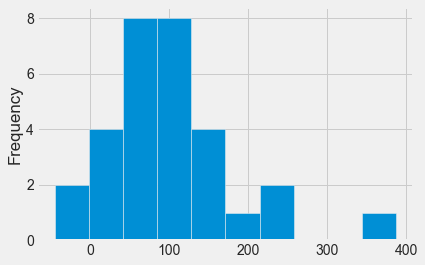

In [259]:
residuals.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

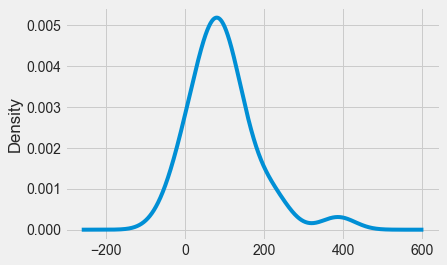

In [260]:
residuals.plot(kind='kde')

In [261]:
residuals.describe()

count     30.000000
mean      96.208336
std       84.930377
min      -44.698331
25%       51.451669
50%       85.301669
75%      128.701669
max      387.101669
dtype: float64

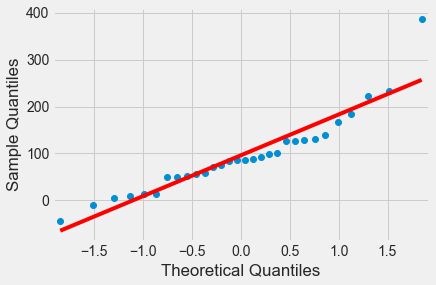

In [262]:
import statsmodels.api as smf
residuals=np.array(residuals)
fig=smf.qqplot(residuals,line='r')
plt.show()

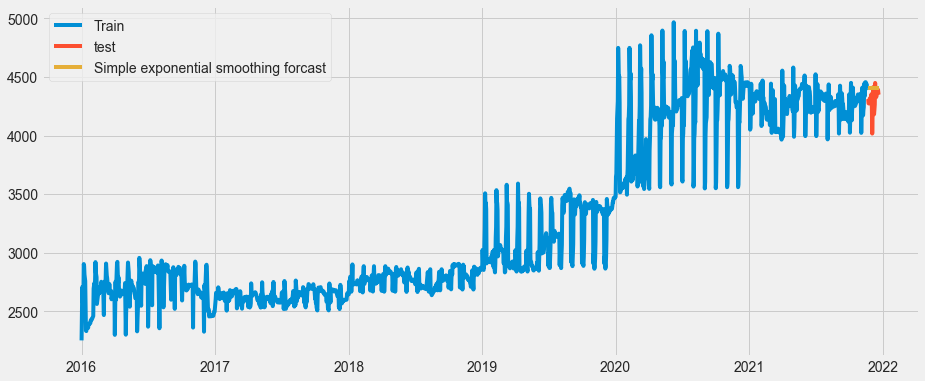

In [263]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.legend(loc='best')
plt.show()

#### Observation
1. The Mean Of the error is far from the error so that there is some bias in the model and also the QQ plot of the error is not linear so the model would perform better 

---
### Holt method (Double Exponential) 

##### Captures both Level and Trend .

In [264]:
dexp_model  = Holt(train_data).fit(optimized=True)
test_pred_dexp = dexp_model.forecast(30)
train_pred_dexp = dexp_model.fittedvalues
test_rmse_dexp = sqrt(mean_squared_error(test_pred_dexp,test_data.price))
train_rmse_dexp = sqrt(mean_squared_error(train_pred_dexp,train_data))
mape_dexp = MAPE(test_pred_dexp,test_data.price)
print('Simple Exponential Method Evaluation',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_dexp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_dexp),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_dexp))

Simple Exponential Method Evaluation 
 Mean Absolute Percent Error = 3.159214564329312 
 Train Root Mean Squared Error = 115.59886303932664 
 Test Root Mean Squared Error = 155.38762310944605


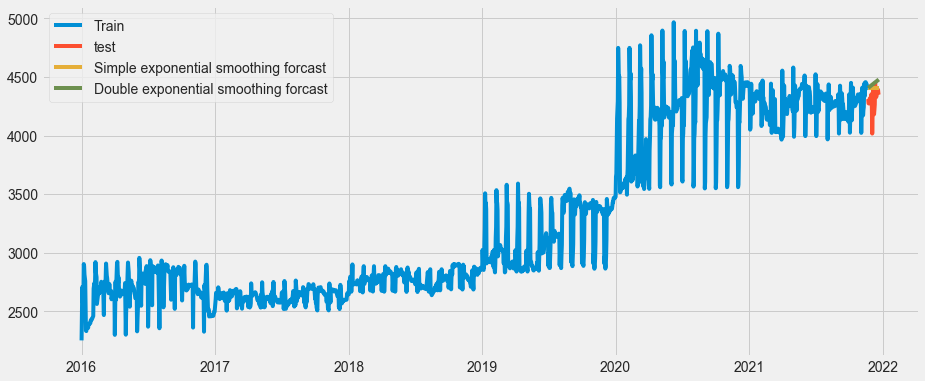

In [265]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.legend(loc='best')
plt.show()

### Model Evluation

In [266]:
res2=test_pred_dexp-test_data.price
res2

2021-11-22     95.530464
2021-11-23    134.199802
2021-11-24    138.169140
2021-11-25    135.838479
2021-11-26    100.907817
2021-11-27    100.177155
2021-11-28    102.646493
2021-11-29    120.115831
2021-11-30    149.485169
2021-12-01     75.754508
2021-12-02    193.323846
2021-12-03    416.793184
2021-12-04    265.962522
2021-12-05    133.331860
2021-12-06     27.701199
2021-12-07    124.370537
2021-12-08    264.739875
2021-12-09    229.309213
2021-12-10    186.478551
2021-12-11      4.747890
2021-12-12    122.617228
2021-12-13    107.186566
2021-12-14    132.855904
2021-12-15    114.825242
2021-12-16     66.194580
2021-12-17     74.063919
2021-12-18     81.433257
2021-12-19     83.902595
2021-12-20    121.771933
2021-12-21    131.841271
Freq: D, dtype: float64

<AxesSubplot:ylabel='Frequency'>

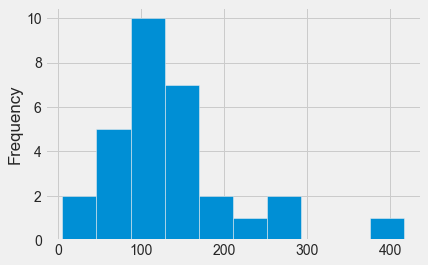

In [267]:
## Histogram and densityplot
res2.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

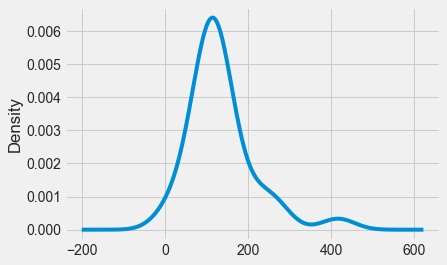

In [268]:
res2.plot(kind='kde')

In [269]:
res2.describe()

count     30.000000
mean     134.542534
std       79.069720
min        4.747890
25%       96.692137
50%      122.194580
75%      137.586475
max      416.793184
dtype: float64

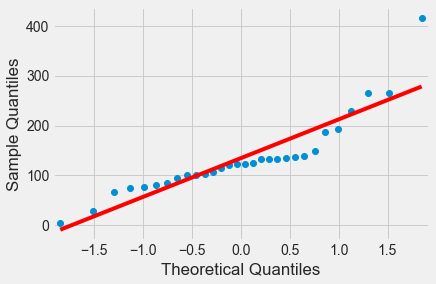

In [270]:
res2=np.array(res2)
smf.qqplot(res2,line='r')
plt.show()

#### Observation
1. We can see that we are able to capture the trend of the data.
2. The Higher mean shows the model is bias.

### Holts winter exponential smoothing with additive seasonality and trend (Triple Exponential)


##### Captures Level, Trend and Seasonality.



In [271]:
texp_add_model  = ExponentialSmoothing(train_data,seasonal="add",trend="add",seasonal_periods=30).fit(optimized=True)
test_pred_ad_texp = texp_add_model.forecast(30)
train_pred_ad_texp = texp_add_model.fittedvalues
test_rmse_ad_texp = sqrt(mean_squared_error(test_pred_ad_texp,test_data.price))
train_rmse_ad_texp = sqrt(mean_squared_error(train_pred_ad_texp,train_data))
mape_ad_texp = MAPE(test_pred_ad_texp,test_data.price)
print('Triple Exponential with Additive Trend and Seosonality Method Evaluation',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ad_texp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ad_texp),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_ad_texp))

Triple Exponential with Additive Trend and Seosonality Method Evaluation 
 Mean Absolute Percent Error = 8.792442279206348 
 Train Root Mean Squared Error = 123.958280574296 
 Test Root Mean Squared Error = 407.4389251448713


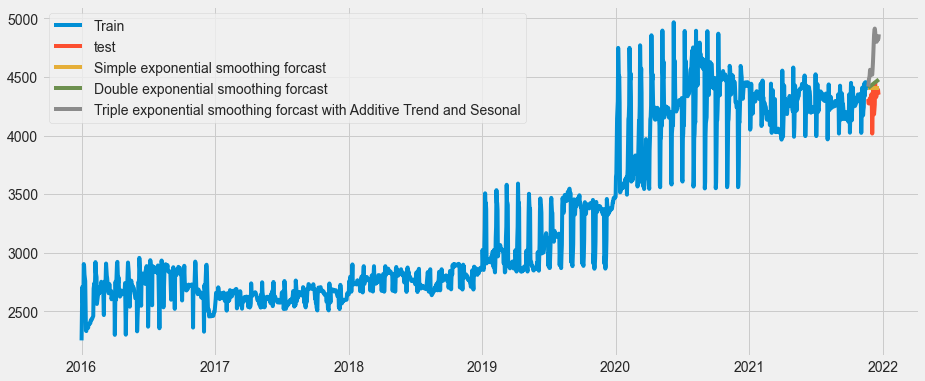

In [272]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.legend(loc='best')
plt.show()

In [273]:
res3=test_pred_ad_texp-test_data.price
res3

2021-11-22    107.026006
2021-11-23    163.200216
2021-11-24    208.897445
2021-11-25    214.797315
2021-11-26    198.263253
2021-11-27    241.942021
2021-11-28    226.511434
2021-11-29    238.800034
2021-11-30    278.253505
2021-12-01    185.050526
2021-12-02    292.236914
2021-12-03    501.966651
2021-12-04    394.174788
2021-12-05    316.648761
2021-12-06    283.097967
2021-12-07    460.291717
2021-12-08    676.316304
2021-12-09    676.721911
2021-12-10    647.855937
2021-12-11    439.326480
2021-12-12    514.056542
2021-12-13    471.667752
2021-12-14    475.833806
2021-12-15    451.222973
2021-12-16    407.970249
2021-12-17    419.334056
2021-12-18    430.241961
2021-12-19    429.031947
2021-12-20    475.089377
2021-12-21    517.169537
Freq: D, dtype: float64

### Model Evluation

<AxesSubplot:ylabel='Frequency'>

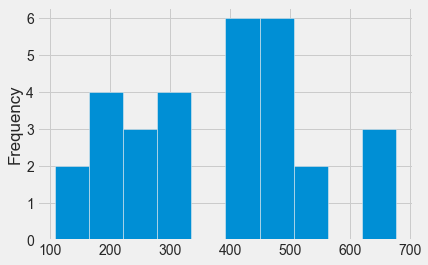

In [274]:
res3.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

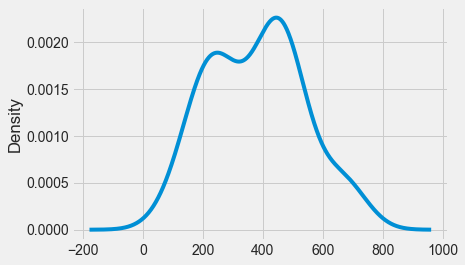

In [275]:
res3.plot(kind='kde')

In [276]:
res3.describe()

count     30.000000
mean     378.099913
std      154.407434
min      107.026006
25%      239.585530
50%      413.652152
75%      474.233971
max      676.721911
dtype: float64

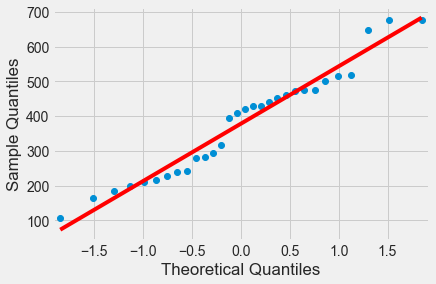

In [277]:
res3=np.array(res3)
smf.qqplot(res3,line='r')
plt.show()

#### Observation
1. It captures the trend, which we can see that the forecasted values are lower level than the test level.
2. It also captures the seasonality.
3. The mean is far away from the 0 so that our model consisting large bias and qqplot is also not linear so we can not used this model for deployment.

### Holts winter exponential smoothing with multiplicative seasonality and additive trend (Triple Exponential)




In [278]:
texp_mul_ad_model  = ExponentialSmoothing(train_data,seasonal="mul",trend="add",seasonal_periods=30).fit(optimized=True)
test_pred_mul_ad_texp = texp_mul_ad_model.forecast(30)
train_pred_mul_ad_texp = texp_mul_ad_model.fittedvalues
test_rmse_mul_ad_texp = sqrt(mean_squared_error(test_pred_mul_ad_texp,test_data.price))
train_rmse_mul_ad_texp = sqrt(mean_squared_error(train_pred_mul_ad_texp,train_data))
mape_mul_ad_texp = MAPE(test_pred_mul_ad_texp,test_data.price)
print('Triple Exponential Method with Multiplicative Seasonality and Additive Trend',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_mul_ad_texp),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_mul_ad_texp),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_mul_ad_texp))

Triple Exponential Method with Multiplicative Seasonality and Additive Trend 
 Mean Absolute Percent Error = 5.530815083933286 
 Train Root Mean Squared Error = 121.85569645236976 
 Test Root Mean Squared Error = 281.8398933330977


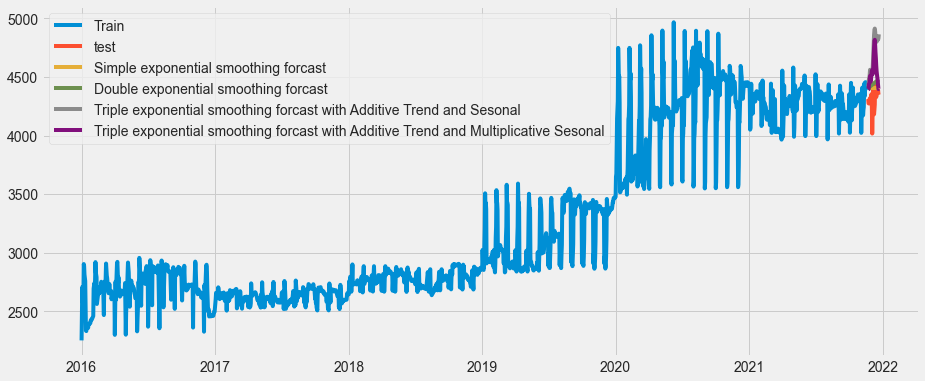

In [279]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.legend(loc='best')
plt.show()

### Model Evaluation

In [280]:
res4=test_pred_mul_ad_texp-test_data.price
res4.shape

(30,)

<AxesSubplot:ylabel='Frequency'>

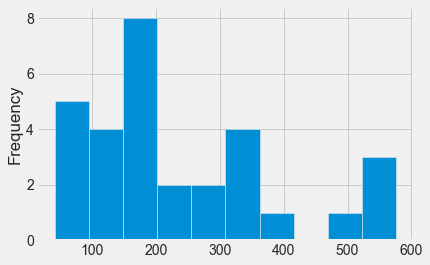

In [281]:
res4.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

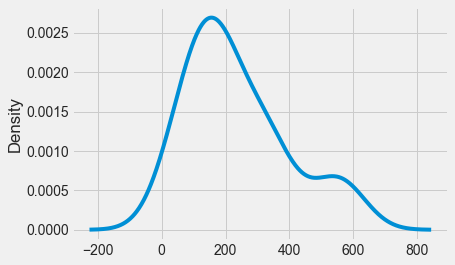

In [282]:
res4.plot(kind='kde')

In [283]:
res4.describe()

count     30.000000
mean     236.277687
std      156.270919
min       41.357631
25%      125.466644
50%      181.926625
75%      321.863439
max      576.220052
dtype: float64

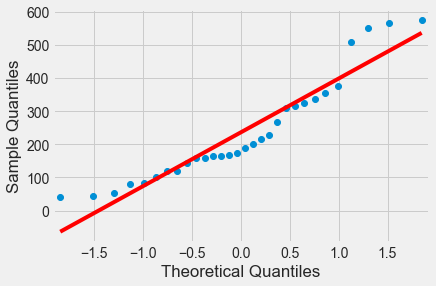

In [284]:
res4=np.array(res4)
smf.qqplot(res4,line='r')
plt.show()

#### Observation
1. We can see that the errors have reduced drastically once we are able to capture the level, trend and seasonality altogether.


### Holts winter exponential smoothing with Additive seasonality and multiplicative trend (Triple Exponential)


#### Observation
1. It captures the trend, which we can see that the forecasted values are higher level than the test level.
2. It also captures the seasonality.
3. The peak of the forecasted value is higher than the actual.

### Holts winter exponential smoothing with multiplicative seasonality and multiplicative trend (Triple Exponential)




In [286]:
texp_ad_mul_model  = ExponentialSmoothing(train_data,seasonal="add",trend="mul",seasonal_periods=30).fit(smoothing_level=0.1, smoothing_slope=0.5)
test_pred_ad_mul_texp  = texp_ad_mul_model.forecast(30)
train_pred_ad_mul_texp  = texp_ad_mul_model.fittedvalues
test_rmse_ad_mul_texp  = sqrt(mean_squared_error(test_pred_ad_mul_texp ,test_data.price))
train_rmse_ad_mul_texp  = sqrt(mean_squared_error(train_pred_ad_mul_texp ,train_data))
mape_ad_mul_texp  = MAPE(test_pred_ad_mul_texp,test_data.price)
print('Triple Exponential Method with Additive Seasonality and Multiplicative Trend',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_ad_mul_texp ),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_ad_mul_texp ),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_ad_mul_texp ))

Triple Exponential Method with Additive Seasonality and Multiplicative Trend 
 Mean Absolute Percent Error = 21.785968201715267 
 Train Root Mean Squared Error = 280.3934594418439 
 Test Root Mean Squared Error = 1059.5762272088753


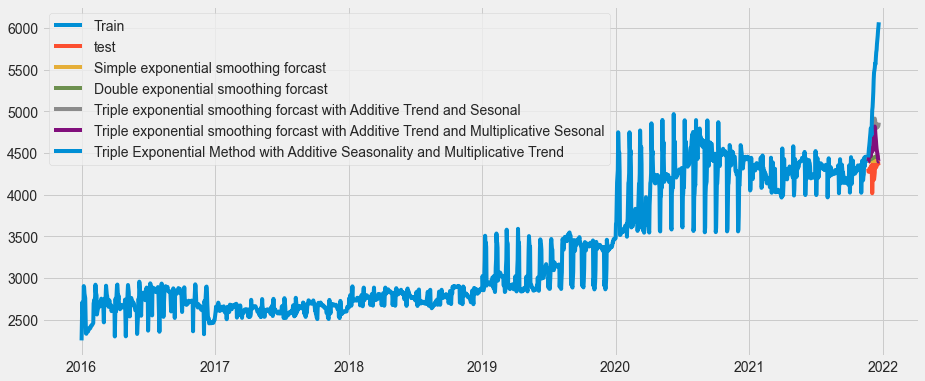

In [287]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.plot(test_pred_ad_mul_texp, label='Triple Exponential Method with Additive Seasonality and Multiplicative Trend')
plt.legend(loc='best')
plt.show()

In [288]:
res5=test_pred_ad_mul_texp-test_data.price
res5.shape

(30,)

### Model Evaluation

<AxesSubplot:ylabel='Frequency'>

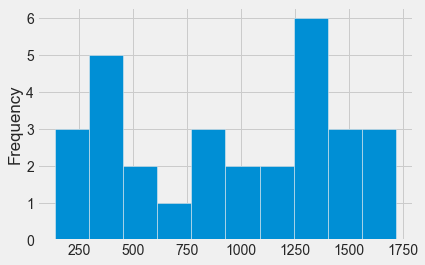

In [289]:
res5.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

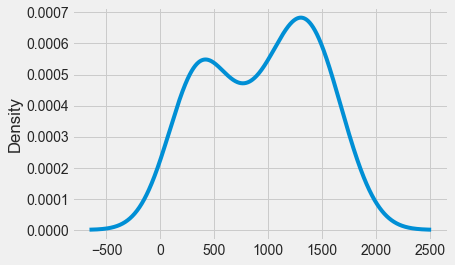

In [290]:
res5.plot(kind='kde')

In [291]:
res5.describe()

count      30.000000
mean      940.273883
std       496.803721
min       135.090755
25%       437.381252
50%      1025.789222
75%      1356.740741
max      1720.364538
dtype: float64

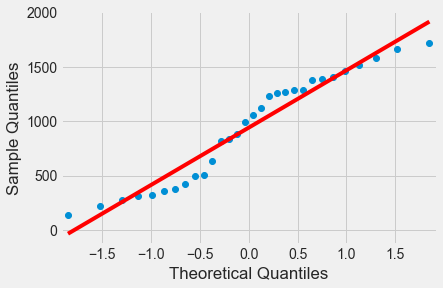

In [292]:
res5=np.array(res5)
smf.qqplot(res5,line='r')
plt.show()

In [294]:
texp_mul_model  = ExponentialSmoothing(train_data,seasonal="mul",trend="mul",seasonal_periods=30).fit(optimized=True)
test_pred_mul_texp  = texp_mul_model.forecast(30)
train_pred_mul_texp  = texp_mul_model.fittedvalues
test_rmse_mul_texp  = sqrt(mean_squared_error(test_pred_mul_texp ,test_data.price))
train_rmse_mul_texp  = sqrt(mean_squared_error(train_pred_mul_texp ,train_data))
mape_mul_texp  = MAPE(test_pred_mul_texp,test_data.price)
print('Triple Exponential Method with multiplicative Trend and Seasonality',"\n",\
      'Mean Absolute Percent Error = {}'.format(mape_mul_texp ),"\n",\
'Train Root Mean Squared Error = {}'.format(train_rmse_mul_texp ),"\n",
'Test Root Mean Squared Error = {}'.format(test_rmse_mul_texp ))

Triple Exponential Method with multiplicative Trend and Seasonality 
 Mean Absolute Percent Error = 4.345981192669858 
 Train Root Mean Squared Error = 129.4557782707973 
 Test Root Mean Squared Error = 236.46706803836588


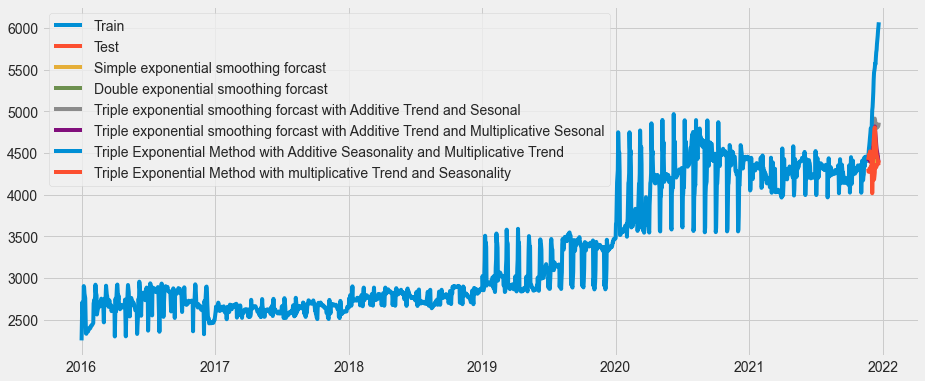

In [295]:
plt.figure(figsize=(14,6))
plt.plot(train_data, label='Train')
plt.plot(test_data, label='Test')
plt.plot(test_pred_ses, label='Simple exponential smoothing forcast')
plt.plot(test_pred_dexp, label='Double exponential smoothing forcast')
plt.plot(test_pred_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Sesonal')
plt.plot(test_pred_mul_ad_texp, label='Triple exponential smoothing forcast with Additive Trend and Multiplicative Sesonal')
plt.plot(test_pred_ad_mul_texp, label='Triple Exponential Method with Additive Seasonality and Multiplicative Trend')
plt.plot(test_pred_mul_texp, label='Triple Exponential Method with multiplicative Trend and Seasonality')
plt.legend(loc='best')
plt.show()

###  Model Evluation

In [296]:
res5=test_pred_mul_texp -test_data.price
res5.shape

(30,)

<AxesSubplot:ylabel='Frequency'>

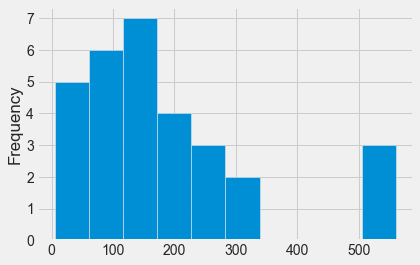

In [297]:
res5.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

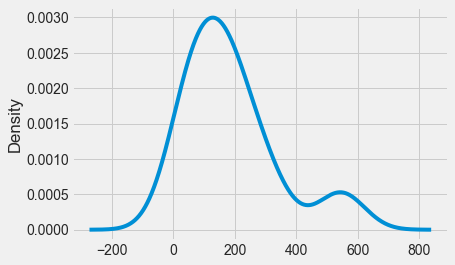

In [298]:
res5.plot(kind='kde')

In [299]:
res5.describe()

count     30.000000
mean     185.870542
std      148.679762
min        4.865158
25%       72.209615
50%      154.958192
75%      232.724691
max      561.174466
dtype: float64

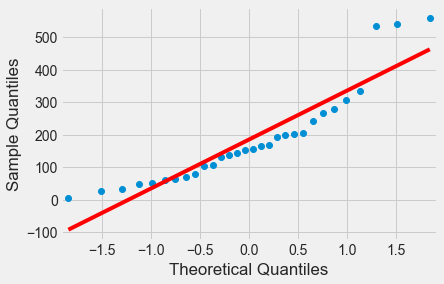

In [300]:
res5=np.array(res5)
smf.qqplot(res5,line='r')
plt.show()

In [301]:
#Comparing the results 

Evaluation = {"Models":pd.Series(["Simple_Exp","Double_Exp","Triple_Exp_ad","Triple_Exp_mul_ad","Triple_Exp_ad_mul"\
                                  ,"Triple_Exp_mul"]),\
        "Train_RMSE":pd.Series([train_rmse_ses,train_rmse_dexp,train_rmse_ad_texp,train_rmse_mul_ad_texp,train_rmse_ad_mul_texp,train_rmse_mul_texp]),\
        "Test_MAPE(%)":pd.Series([mape_ses,mape_dexp,mape_ad_texp,mape_mul_ad_texp,mape_ad_mul_texp,mape_mul_texp]),\
        "Test_RMSE_Values":pd.Series([test_rmse_ses,test_rmse_dexp,test_rmse_ad_texp,test_rmse_mul_ad_texp,test_rmse_ad_mul_texp,test_rmse_mul_texp])}
table_evaluation=pd.DataFrame(Evaluation)
table_evaluation.sort_values(['Test_MAPE(%)'], inplace=True, ignore_index=True)
table_evaluation

,Models,Train_RMSE,Test_MAPE(%),Test_RMSE_Values
0,Simple_Exp,114.244847,2.353934,127.392205
1,Double_Exp,115.598863,3.159215,155.387623
2,Triple_Exp_mul,129.455778,4.345981,236.467068
3,Triple_Exp_mul_ad,121.855696,5.530815,281.839893
4,Triple_Exp_ad,123.958281,8.792442,407.438925
5,Triple_Exp_ad_mul,280.393459,21.785968,1059.576227


### Visualizing Models Performance


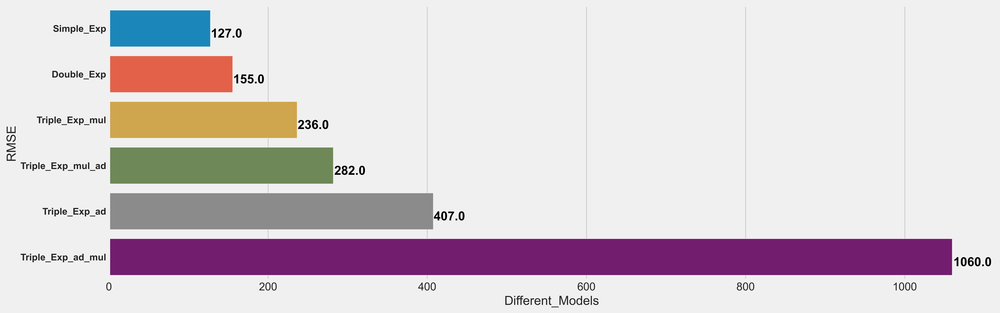

In [302]:
f, axe = plt.subplots(1,1, figsize=(18,6), dpi=500)
sns.barplot(x='Test_RMSE_Values', y='Models', data=table_evaluation, ax = axe)
axe.set_xlabel('Different_Models', size=16)
axe.set_ylabel('RMSE', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=14)


for i, v in enumerate(np.round(table_evaluation.Test_RMSE_Values.values,0)):
    axe.text(v + 1, i + .20, str(v),
            color = 'black', fontweight = 'bold', fontsize= 16)

plt.show()

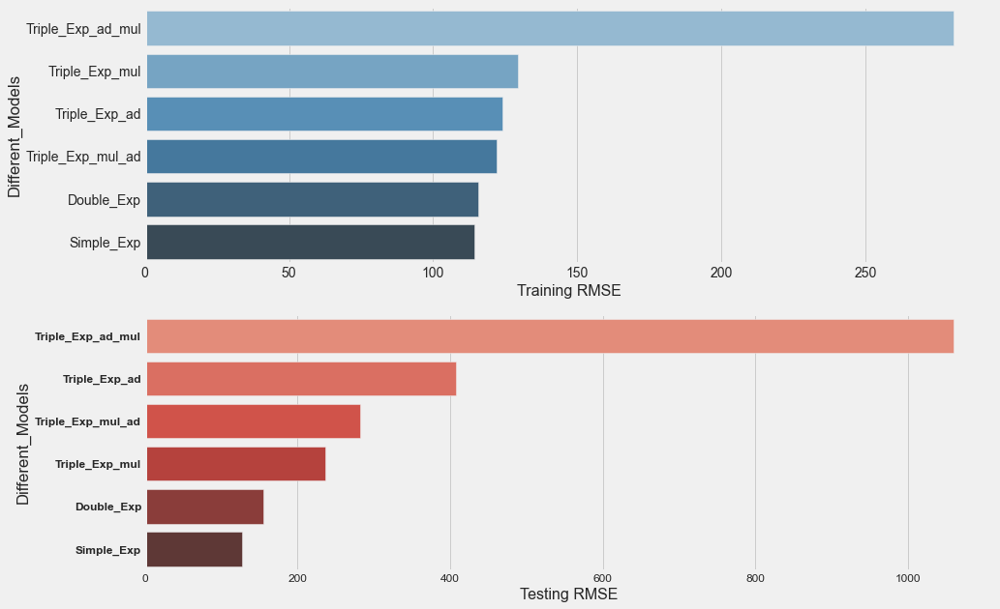

In [303]:
f, axes = plt.subplots(2,1, figsize=(14,10))
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=12)
train_rmse = table_evaluation.sort_values(by=['Train_RMSE'], ascending=False)

sns.barplot(x='Train_RMSE', y='Models', data = train_rmse, palette='Blues_d', ax = axes[0])
axes[0].set_xlabel('Training RMSE', size=16)
axes[0].set_ylabel('Different_Models')

test_rmse = table_evaluation.sort_values(by=['Test_RMSE_Values'], ascending=False)

sns.barplot(x='Test_RMSE_Values', y='Models', data = test_rmse, palette='Reds_d', ax = axes[1])
axes[1].set_xlabel('Testing RMSE', size=16)
axes[1].set_ylabel('Different_Models')

plt.show()

# Autoregressive Integrated Moving Averages (ARIMA)

Recall that an <strong>AR(1)</strong> model follows the formula

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = c + \phi_{1}y_{t-1} + \varepsilon_{t}$

while an <strong>MA(1)</strong> model follows the formula

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = \mu + \theta_{1}\varepsilon_{t-1} + \varepsilon_{t}$

where $c$ is a constant, $\mu$ is the expectation of $y_{t}$ (often assumed to be zero), $\phi_1$ is the AR lag coefficient, $\theta_1$ (theta-sub-one) is the MA lag coefficient, and $\varepsilon$ (epsilon) is white noise.

An <strong>ARMA(1,1)</strong> model therefore follows

&nbsp;&nbsp;&nbsp;&nbsp;$y_{t} = c + \phi_{1}y_{t-1} + \theta_{1}\varepsilon_{t-1} + \varepsilon_{t}$
#### Stationary vs Non-stationary Time Series


### Test of Stationarity


##### As we have yearly data the window size for moving average is equal to 12



In [304]:
def test_stationarity(timeseries):
    
    #Determine rolling statistics
    movingAverage = timeseries.rolling(window=30).mean()
    movingSTD = timeseries.rolling(window=30).std()
    
    #Plot rolling statistics
    orig = plt.plot(timeseries, color='blue', label='Original')
    mean = plt.plot(movingAverage, color='red', label='Rolling Mean')
    plt.legend(loc='best')
    plt.title('Rolling Mean')
    plt.show(block=False)
    
    #Perform Dickey–Fuller test:
    print('Results of Dickey Fuller Test:')
    dftest = adfuller(timeseries['price'], autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

#### Augmented Dicky Fuller Test
Null Hypothesis (H0): The series is not stationary

p-val > 0.05

Alternate Hypothesis (H1): The series is stationary

p-val <= 0.05

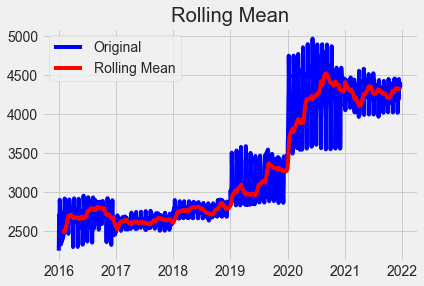

Results of Dickey Fuller Test:
Test Statistic                   -0.309904
p-value                           0.924090
#Lags Used                       26.000000
Number of Observations Used    2155.000000
Critical Value (1%)              -3.433388
Critical Value (5%)              -2.862882
Critical Value (10%)             -2.567484
dtype: float64


In [305]:
gold_price= pd.DataFrame()
gold_price=df1[['price']]
gold_price['price'] = df1[['price']]
test_stationarity(gold_price)

In [306]:
from statsmodels.tsa.stattools import adfuller
def adf_test(series):    
    result = adfuller(series.dropna())  
    labels = ['ADF test statistic','p-value','# lags used','# observations']
    out = pd.Series(result[0:4],index=labels)
    #for key,val in result[4].items():
        #out[f'critical value ({key})']=val
    if result[1] <= 0.05:
        print("Reject the null hypothesis")
        print("Data is stationary")
    else:
        print("Fail to reject the null hypothesis")
        print("Data is non-stationary")

In [307]:
adf_test(gold_price)

Fail to reject the null hypothesis
Data is non-stationary


### Feature Scaling (Transformations)

#### Square Root Transform



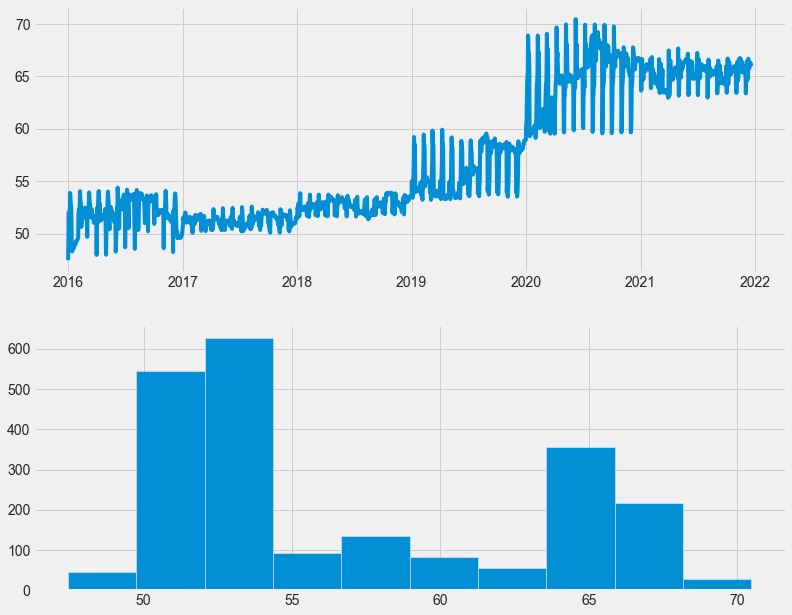

In [308]:
square_root= pd.DataFrame()
square_root = df1[['price']]
square_root['price'] = np.sqrt(square_root.price)

# line chart
fig=plt.figure(figsize=(12,10))
plt.subplot(211)
plt.plot(square_root['price'])
#Histogram
plt.subplot(212)
plt.hist(square_root['price'])
plt.show()

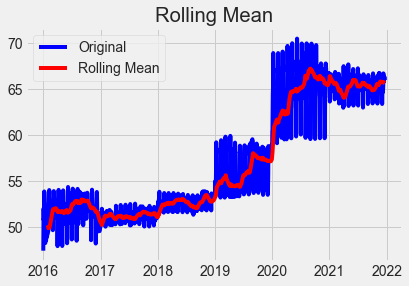

Results of Dickey Fuller Test:
Test Statistic                   -0.372419
p-value                           0.914603
#Lags Used                       26.000000
Number of Observations Used    2155.000000
Critical Value (1%)              -3.433388
Critical Value (5%)              -2.862882
Critical Value (10%)             -2.567484
dtype: float64


In [309]:
test_stationarity(square_root)

In [310]:
adf_test(square_root)

Fail to reject the null hypothesis
Data is non-stationary


### Log Transform

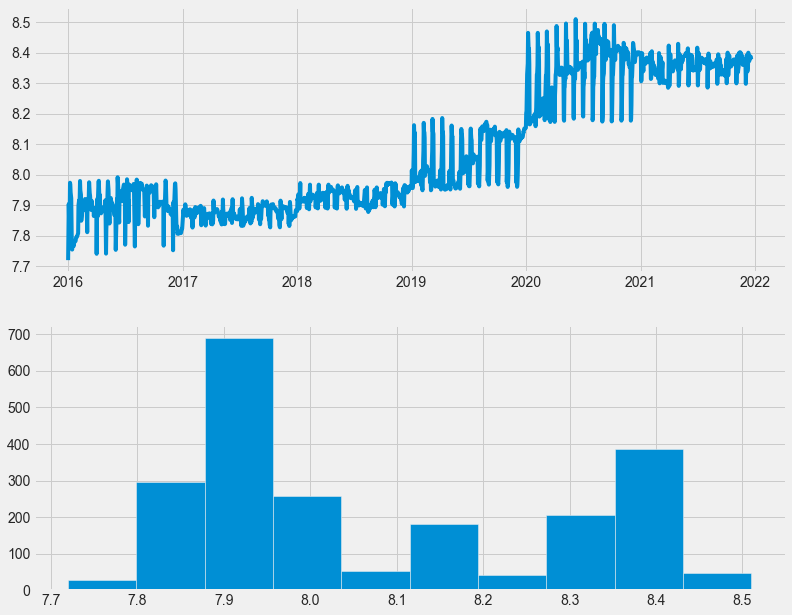

In [311]:
log = pd.DataFrame()
log = df1[['price']]
log['price'] = np.log(log.price)

# line chart
fig=plt.figure(figsize=(12,10))
plt.subplot(211)
plt.plot(log['price'])
#Histogram
plt.subplot(212)
plt.hist(log['price'])
plt.show()

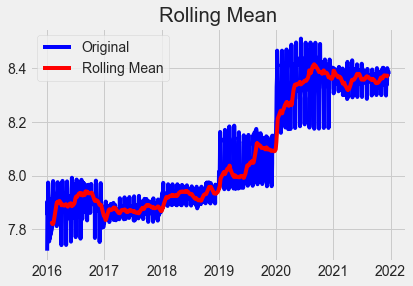

Results of Dickey Fuller Test:
Test Statistic                   -0.457214
p-value                           0.900099
#Lags Used                       26.000000
Number of Observations Used    2155.000000
Critical Value (1%)              -3.433388
Critical Value (5%)              -2.862882
Critical Value (10%)             -2.567484
dtype: float64


In [312]:
test_stationarity(log)

In [313]:
adf_test(log)

Fail to reject the null hypothesis
Data is non-stationary


##### Hence, the Time series data is Non-Stationary

### Converting Non-Stationary Time Series into Stationary

#### Differencing
In this method, we compute the difference of consecutive terms in the series. Differencing is typically performed to get rid of the varying mean. Mathematically, differencing can be written as:

yt‘ = yt – y(t-1)

where yt is the value at a time t

Applying differencing on our series and plotting the results:

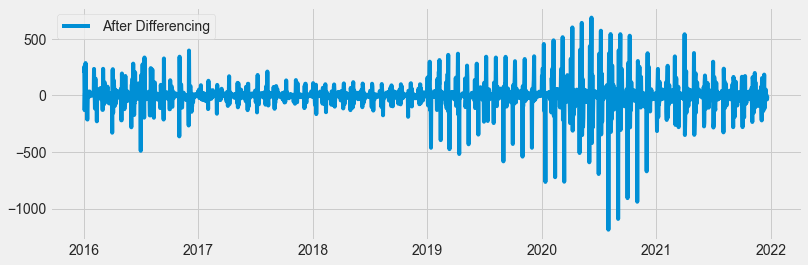

In [314]:
differencing = df1 - df1.shift(1)
differencing.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(differencing, label='After Differencing')
plt.legend(loc='best')
plt.show()

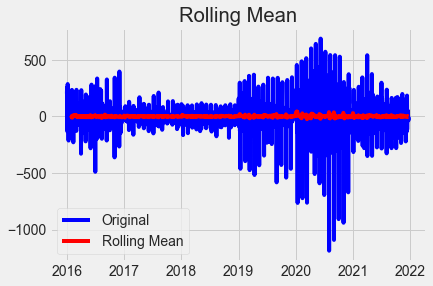

Results of Dickey Fuller Test:
Test Statistic                  -21.664542
p-value                           0.000000
#Lags Used                       26.000000
Number of Observations Used    2154.000000
Critical Value (1%)              -3.433390
Critical Value (5%)              -2.862883
Critical Value (10%)             -2.567485
dtype: float64


In [315]:
test_stationarity(differencing)

In [316]:
adf_test(differencing)

Reject the null hypothesis
Data is stationary


#### Seasonal Differencing
In seasonal differencing, instead of calculating the difference between consecutive values, we calculate the difference between an observation and a previous observation from the same season. For example, an observation taken on a Monday will be subtracted from an observation taken on the previous Monday. Mathematically it can be written as:

yt‘ = yt – y(t-n)

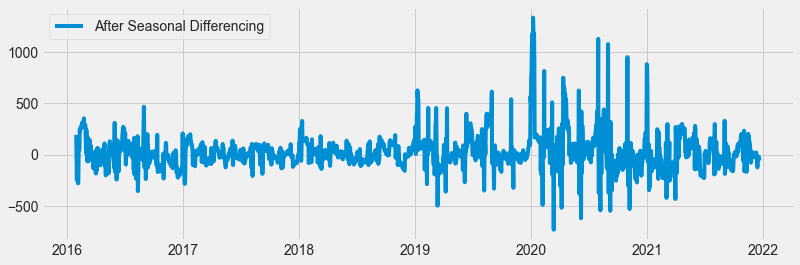

In [317]:
seasonal_differencing = df1 - df1.shift(30)
seasonal_differencing.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(seasonal_differencing, label='After Seasonal Differencing')
plt.legend(loc='best')
plt.show()

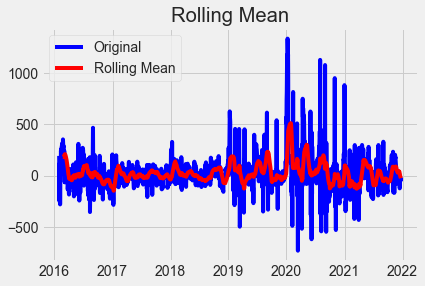

Results of Dickey Fuller Test:
Test Statistic                -1.001262e+01
p-value                        1.762328e-17
#Lags Used                     7.000000e+00
Number of Observations Used    2.144000e+03
Critical Value (1%)           -3.433404e+00
Critical Value (5%)           -2.862889e+00
Critical Value (10%)          -2.567488e+00
dtype: float64


In [318]:
test_stationarity(seasonal_differencing)

In [319]:
adf_test(seasonal_differencing)

Reject the null hypothesis
Data is stationary


#### Transformation
Transformations are used to stabilize the non-constant variance of a series. Common transformation methods include power transform, square root, and log transform. Let’s do a quick log transform and differencing on our air passenger dataset:

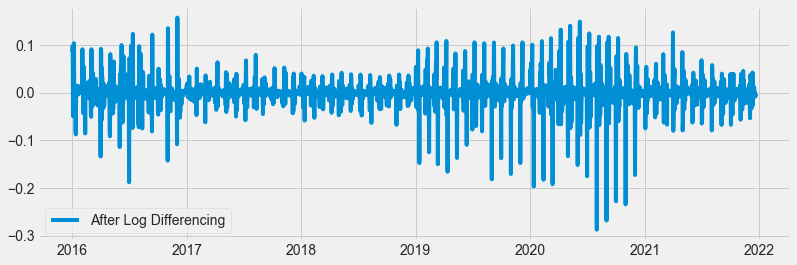

In [320]:
log_diff = log - log.shift(1)
log_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(log_diff, label='After Log Differencing')
plt.legend(loc='best')
plt.show()

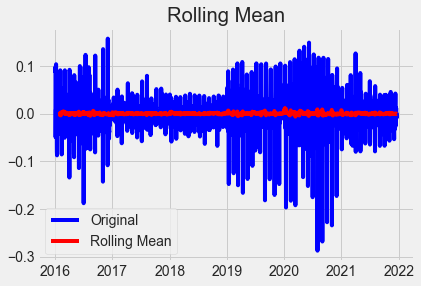

Results of Dickey Fuller Test:
Test Statistic                  -21.394232
p-value                           0.000000
#Lags Used                       26.000000
Number of Observations Used    2154.000000
Critical Value (1%)              -3.433390
Critical Value (5%)              -2.862883
Critical Value (10%)             -2.567485
dtype: float64


In [321]:
test_stationarity(log_diff)

In [322]:
adf_test(log_diff)

Reject the null hypothesis
Data is stationary


#### Box Cox Transformation

,price
date,
2016-01-01,7.719840
2016-01-02,7.805678
2016-01-03,7.904003
2016-01-04,7.854692
2016-01-05,7.862401


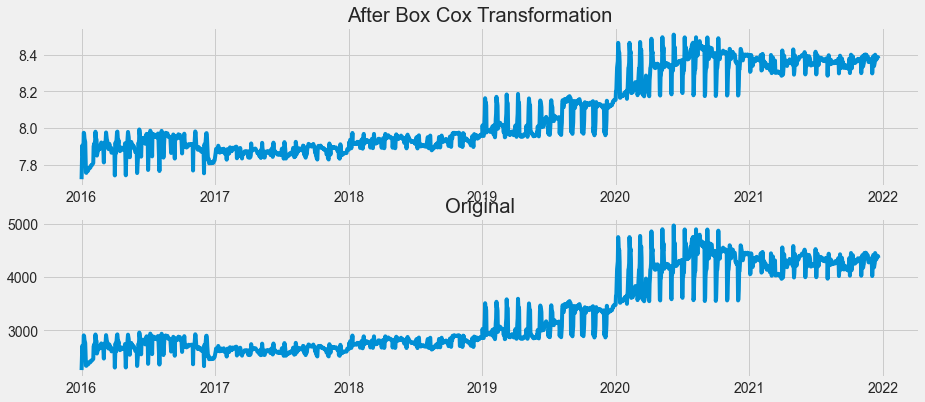

In [323]:
data_boxcox = pd.DataFrame()
data_boxcox['price'] = pd.Series(boxcox(df1['price'], lmbda=0), df1.index)
display(data_boxcox.head())
fig, axis = plt.subplots(2,figsize=(14,6),)
axis[0].plot(data_boxcox)
axis[0].set_title('After Box Cox Transformation')
axis[1].plot(df1, label='original')
axis[1].set_title('Original')
plt.show()

#### Observation
1. We can see the variance became little constant after the transformation. Both in the earlier and later years the variance is little close to  similar.
2. But we can see that still the series has an upward trend. So, the mean is not constant yet. Hence, we need to do `Differencing` for making the mean constant.

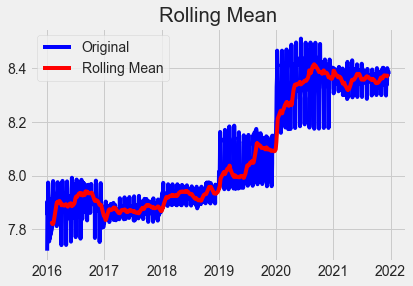

Results of Dickey Fuller Test:
Test Statistic                   -0.457214
p-value                           0.900099
#Lags Used                       26.000000
Number of Observations Used    2155.000000
Critical Value (1%)              -3.433388
Critical Value (5%)              -2.862882
Critical Value (10%)             -2.567484
dtype: float64


In [324]:
test_stationarity(data_boxcox)

In [325]:
adf_test(data_boxcox)

Fail to reject the null hypothesis
Data is non-stationary


#### Differencing of the Box-Cox Transformation
Differencing is performed by subtracting the previous observation from the current observation.

Differencing removes trend and seasonality in a Time series. When an entire cycle is used for differencing the other cycle, then the seasonality is removed.

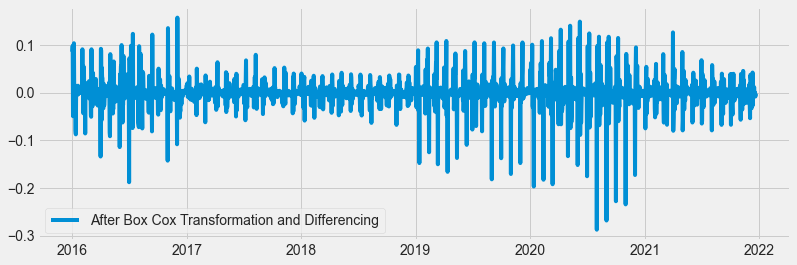

In [326]:
# data_boxcox - data_boxcox.shift() :- Performs difference between the previous and current observations.
data_boxcox_diff = data_boxcox - data_boxcox.shift()
data_boxcox_diff.dropna(inplace=True)
plt.figure(figsize=(12,4))
plt.plot(data_boxcox_diff, label='After Box Cox Transformation and Differencing')
plt.legend(loc='best')
plt.show()

#### Observation
1. We can see that there is no trend (upward or downward) after differencing on the Box Cox transformation. 
2. It is a horizontal trend.
3. The mean became constant. The mean is zero.
4. Also, the variance is little constant.

Lets test the Stationarity again.

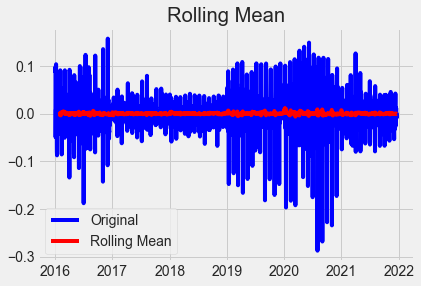

Results of Dickey Fuller Test:
Test Statistic                  -21.394232
p-value                           0.000000
#Lags Used                       26.000000
Number of Observations Used    2154.000000
Critical Value (1%)              -3.433390
Critical Value (5%)              -2.862883
Critical Value (10%)             -2.567485
dtype: float64


In [327]:
#check this log transfered data with function
test_stationarity(data_boxcox_diff)

In [328]:
adf_test(data_boxcox_diff)

Reject the null hypothesis
Data is stationary


***order(p,d,q)***

p = Periods to lag for eg: (if P= 3 then we will use the three previous periods of our time series in the autoregressive portion of the calculation) P helps adjust the line that is being fitted to forecast the series.

d = In an ARIMA model we transform a time series into stationary one(series without trend or seasonality) using differencing. D refers to the number of differencing transformations required by the time series to get stationary.


q = This variable denotes the lag of the error component, where error component is a part of the time series not explained by trend or seasonality.

In [330]:
# grid search ARIMA parameters for a time series

# evaluate an ARIMA model for a given order (p,d,q) and return RMSE
def evaluate_arima_model(X, arima_order):
# prepare training dataset
    X = X.astype('float32')
    train_size = int(len(X)-30)
    train, test = X[0:train_size], X[train_size:]
    history = [x for x in train]
# make predictions
    predictions = list()
    for t in range(len(test)):
        model = ARIMA(history, order=arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[t])
# calculate out of sample error
    rmse = sqrt(mean_squared_error(test, predictions))
    return rmse

In [331]:
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
    dataset = dataset.astype('float32')
    best_score, best_cfg = float('inf'), None
    for p in p_values:
        for d in d_values:
            for q in q_values:
                order = (p,d,q)
                try:
                    rmse = evaluate_arima_model(dataset, order)
                    if rmse < best_score:
                        best_score, best_cfg = rmse, order
                    print('ARIMA%s RMSE=%.3f' % (order,rmse))
                except Exception as e:
                    print(e)
                    continue
    print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))

In [332]:
# evaluate parameters
p_values = range(0, 3)
d_values = range(0, 3)
q_values = range(0, 3)
evaluate_models(data_boxcox_diff.price, p_values, d_values, q_values)

ARIMA(0, 0, 0) RMSE=0.020
ARIMA(0, 0, 1) RMSE=0.020
ARIMA(0, 0, 2) RMSE=0.019
ARIMA(0, 1, 0) RMSE=0.028
ARIMA(0, 1, 1) RMSE=0.020
ARIMA(0, 1, 2) RMSE=0.020
ARIMA(0, 2, 0) RMSE=0.045
ARIMA(0, 2, 1) RMSE=0.028
ARIMA(0, 2, 2) RMSE=0.020
ARIMA(1, 0, 0) RMSE=0.020
ARIMA(1, 0, 1) RMSE=0.019
ARIMA(1, 0, 2) RMSE=0.018
ARIMA(1, 1, 0) RMSE=0.027
ARIMA(1, 1, 1) RMSE=0.020
ARIMA(1, 1, 2) RMSE=0.020
ARIMA(1, 2, 0) RMSE=0.038
ARIMA(1, 2, 1) RMSE=0.027
ARIMA(1, 2, 2) RMSE=0.020
ARIMA(2, 0, 0) RMSE=0.019
ARIMA(2, 0, 1) RMSE=0.018
ARIMA(2, 0, 2) RMSE=0.018
ARIMA(2, 1, 0) RMSE=0.026
ARIMA(2, 1, 1) RMSE=0.019
ARIMA(2, 1, 2) RMSE=0.020
ARIMA(2, 2, 0) RMSE=0.037
ARIMA(2, 2, 1) RMSE=0.026
ARIMA(2, 2, 2) RMSE=0.019
Best ARIMA(1, 0, 2) RMSE=0.018


#### Building The Time Series Forecasting with Optimal Value using ARIMA
Automatically performs the Differencing if the series has trend.

Hence, no need to manually perform the differencing.



In [334]:
train_data_boxcox = data_boxcox[:size]
test_data_boxcox_diff = data_boxcox[size:]
train_data_boxcox_diff = data_boxcox_diff[:size]
test_data_boxcox_diff = data_boxcox_diff[size:]

##### Inverse transformation of the Box-Cox Differencing 
As we have converted the original time series to Stationary series by consecutively applying BoxCox transformation and Differencing. We have to transform the series back to the original one (step by step).



In [335]:
model = ARIMA(train_data_boxcox_diff, order=(1, 0, 2))
model_fit = model.fit()
y_hat_ar = data_boxcox_diff.copy()
y_hat_ar['arima_forecast'] = model_fit.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
# We did differencing. So we need to revert it by adding the consecutive observations.
# For that we are using cumsum() method
y_hat_ar['arima_forecast'] = y_hat_ar['arima_forecast'].cumsum()
# We removed the first observations after differencing as it was null. Hence, adding the first observation back.
y_hat_ar['arima_forecast'] = y_hat_ar['arima_forecast'].add(data_boxcox.price[0])
# Now doing the reverse transformation 
# We have done Box Cox Log Log transformation with lambda = 0
# Hence, we have to the exponential as it is the reverse of the log.
y_hat_ar['arima_forecast'] = np.exp(y_hat_ar['arima_forecast'])

In [336]:
y_hat_ar.arima_forecast[test_data.index.min():]

date
2021-11-22    3173.164427
2021-11-23    3165.433351
2021-11-24    3160.102579
2021-11-25    3156.492561
2021-11-26    3154.117521
2021-11-27    3152.629541
2021-11-28    3151.779104
2021-11-29    3151.387082
2021-11-30    3151.324791
2021-12-01    3151.499736
2021-12-02    3151.845409
2021-12-03    3152.313979
2021-12-04    3152.871036
2021-12-05    3153.491823
2021-12-06    3154.158528
2021-12-07    3154.858332
2021-12-08    3155.582012
2021-12-09    3156.322931
2021-12-10    3157.076309
2021-12-11    3157.838711
2021-12-12    3158.607661
2021-12-13    3159.381379
2021-12-14    3160.158583
2021-12-15    3160.938351
2021-12-16    3161.720019
2021-12-17    3162.503109
2021-12-18    3163.287277
2021-12-19    3164.072277
2021-12-20    3164.857930
2021-12-21    3165.644107
Name: arima_forecast, dtype: float64

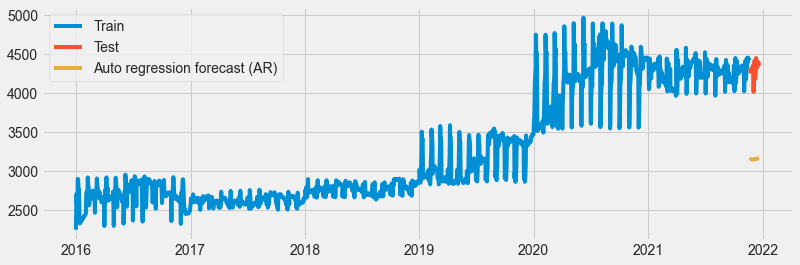

In [337]:
plt.figure(figsize=(12,4))
plt.plot(train_data['price'], label='Train')
plt.plot(test_data, label='Test')
plt.plot(y_hat_ar['arima_forecast'][test_data.index.min():], label='Auto regression forecast (AR)')
plt.legend(loc='best')
plt.show()

### Model Evaluation

In [338]:
res6=model_fit.resid

<AxesSubplot:ylabel='Frequency'>

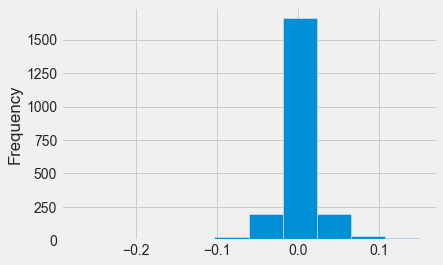

In [339]:
res6.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

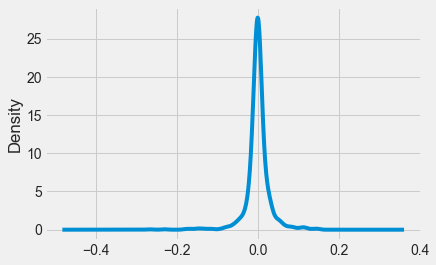

In [340]:
res6.plot(kind='kde')

In [341]:
res6.describe()

count    2151.000000
mean        0.000151
std         0.030570
min        -0.272211
25%        -0.007853
50%         0.000027
75%         0.008667
max         0.150078
dtype: float64

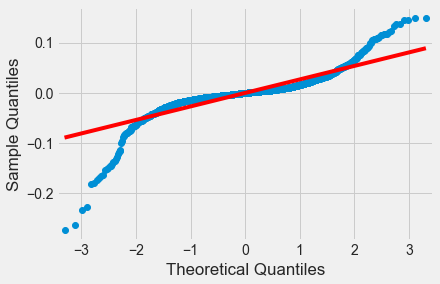

In [342]:
res6=np.array(res6)
smf.qqplot(res6,line='r')
plt.show()

#### Observation
1. This model is the Best model as the mean of the error is near to zero and this indicates that ther is very low bias in the model.
2. The QQ plot also shows linear behaviour so that this model can be used for the deployment


### Model Evaluation

#### RMSE (Root Mean Squared Error)

In [343]:
rmse_ARIMA = np.sqrt(mean_squared_error(test_data, y_hat_ar['arima_forecast'][test_data.index.min():])).round(2)
rmse_ARIMA

1153.04

#### MAPE (Mean Absolute Percent Error)

In [344]:
mape_arima = round(np.mean(np.abs((test_data.price - y_hat_ar['arima_forecast'][test_data.index.min():])/test_data.price)*100),2)
mape_arima

26.67

### Analysing the Residuals

##### The mean of the Residual should be zero or close to Zero



In [345]:
model_residual = model_fit.resid
model_residual.mean()

0.00015108385495282763

#### Residuals must be stationary


In [346]:
adf_test(model_residual)

Reject the null hypothesis
Data is stationary


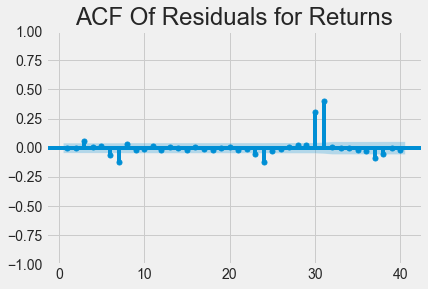

In [347]:
plot_acf(model_residual, zero = False, lags = 40)
plt.title("ACF Of Residuals for Returns",size=24)
plt.show()

#### Residuals must be random

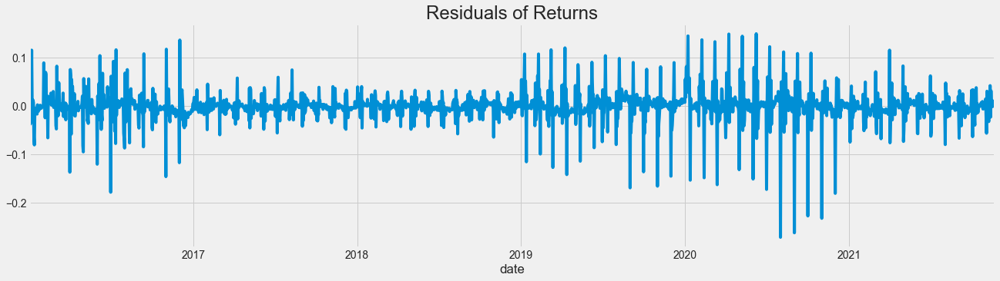

In [348]:
model_residual.plot(figsize=(20,5))
plt.title("Residuals of Returns", size=24)
plt.show()

### Seasonal Auto Regressive Integrated Moving Average (SARIMA)
ARIMA with Seasonal component added.

In [349]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
# We are only passing the Box Cox because the ARIMAX will perform the differencing internally
# seasonal_order P=1, Q=1, D=1 and m=12
# m=12 . Because the seasonality is monthly.

In [350]:
model = SARIMAX(train_data_boxcox, order=(1,1,1), seasonal_order=(1,1,1,12))
model_fit= model.fit()
y_hat_sarima = data_boxcox_diff.copy()

#### Inverse Transformation of the Differencing Box-Cox Transformation
Note that ARIMAM automatically takes care of the reversing of `Differencing` (takes care the `Integration` part automatically). So, we don't need to perform the cumsum here. We only have to do the reverse of the log boc cox transformation.

In ARIMA, we had to perform the cumsum manually.

In [351]:
y_hat_sarima['sarima_forecast_boxcox'] = model_fit.predict(data_boxcox_diff.index.min(), data_boxcox_diff.index.max())
y_hat_sarima['sarima_forecast'] = np.exp(y_hat_sarima['sarima_forecast_boxcox'])
y_hat_sarima['sarima_forecast'] = np.exp(y_hat_sarima['sarima_forecast_boxcox'])

In [352]:
y_hat_sarima

,price,sarima_forecast_boxcox,sarima_forecast
date,,,
2016-01-02,0.085838,7.719840,2252.599998
2016-01-03,0.098324,7.805678,2454.499998
2016-01-04,-0.049311,7.904003,2708.099999
2016-01-05,0.007709,7.854692,2577.799999
2016-01-06,0.007650,7.862401,2597.749999
...,...,...,...
2021-12-17,-0.001228,8.382105,4368.195126
2021-12-18,-0.001116,8.383374,4373.740052
2021-12-19,0.000000,8.383131,4372.679639


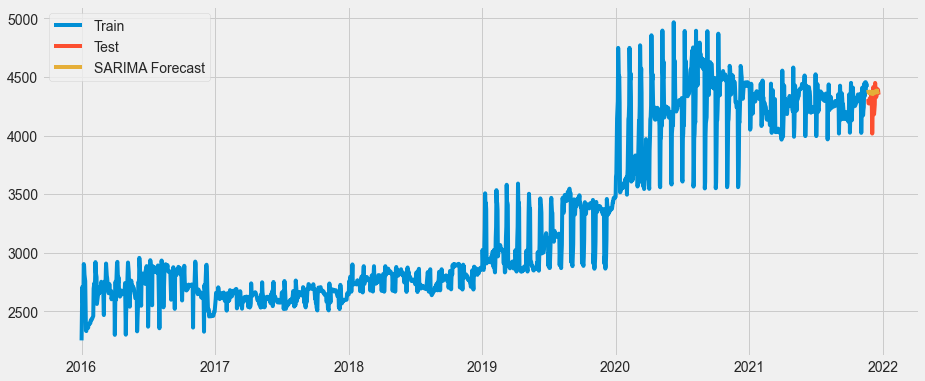

In [353]:
plt.figure(figsize=(14,6))
plt.plot(train_data['price'], label='Train')
plt.plot(test_data, label='Test')
plt.plot(y_hat_sarima['sarima_forecast'][test_data.index.min():], label='SARIMA Forecast')
plt.legend(loc='best')
plt.show()

## Forecated values for 30 days by SARIMA Model:

In [367]:
y_hat_sarima['sarima_forecast'][test_data.index.min():]

date
2021-11-22    4389.647382
2021-11-23    4368.353680
2021-11-24    4369.031047
2021-11-25    4362.023806
2021-11-26    4365.663144
2021-11-27    4362.539582
2021-11-28    4362.331926
2021-11-29    4360.949521
2021-11-30    4369.250882
2021-12-01    4358.059985
2021-12-02    4368.921464
2021-12-03    4372.444958
2021-12-04    4367.700963
2021-12-05    4356.071696
2021-12-06    4361.341260
2021-12-07    4360.102536
2021-12-08    4367.217538
2021-12-09    4366.930734
2021-12-10    4368.536520
2021-12-11    4369.090130
2021-12-12    4378.441342
2021-12-13    4368.248718
2021-12-14    4379.779713
2021-12-15    4383.917309
2021-12-16    4379.562503
2021-12-17    4368.195126
2021-12-18    4373.740052
2021-12-19    4372.679639
2021-12-20    4379.968820
2021-12-21    4379.800457
Name: sarima_forecast, dtype: float64

### Model Evaluation

In [354]:
res7=model_fit.resid
res7

date
2016-01-01    7.719840
2016-01-02    0.085838
2016-01-03    0.098324
2016-01-04   -0.049311
2016-01-05    0.007709
                ...   
2021-11-17    0.009512
2021-11-18   -0.001563
2021-11-19    0.002839
2021-11-20   -0.000985
2021-11-21    0.001650
Length: 2152, dtype: float64

<AxesSubplot:ylabel='Frequency'>

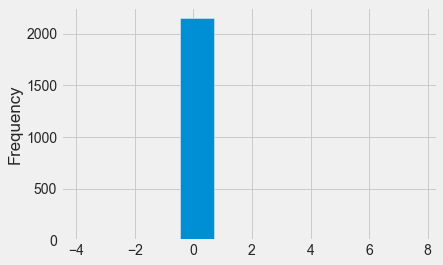

In [355]:
res7.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

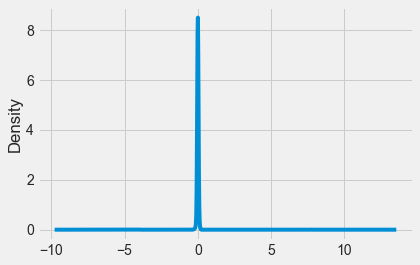

In [356]:
res7.plot(kind='kde')

In [357]:
res7.describe()

count    2152.000000
mean        0.001912
std         0.189593
min        -3.947352
25%        -0.008704
50%         0.000503
75%         0.009091
max         7.719840
dtype: float64

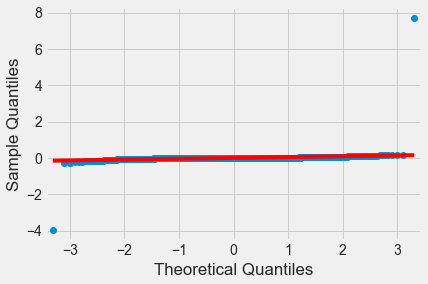

In [358]:
res7=np.array(res7)
smf.qqplot(res7,line='r')
plt.show()

##### We can see that we are able to capture the trend and seasonality both.

### Model Evaluation

#### RMSE (Root Mean Squared Error)

In [359]:
rmse_SARIMA = np.sqrt(mean_squared_error(test_data, y_hat_sarima['sarima_forecast'][test_data.index.min():])).round(2)
rmse_SARIMA

103.5

#### MAPE (Mean Absolute Percent Error)

In [360]:
mape_sarima = round(np.mean(np.abs((test_data.price - y_hat_sarima['sarima_forecast'][test_data.index.min():])/test_data.price)*100),2)
mape_sarima

1.79

#### Observation:
1. SARIMA model shows best result its mean is near to zero so ther is no bias in the model.
2. The QQ plot of the error shows the linear behaviour so that this model is best for the deployment.



### Analysing the Residuals

##### The mean of the Residual should be zero or close to Zero





In [361]:
model_residual = model_fit.resid
model_residual.mean()

0.0019119303316937955

#### Residuals must be stationary



In [362]:
adf_test(model_residual)

Reject the null hypothesis
Data is stationary


#### No autocorrelation between residuals



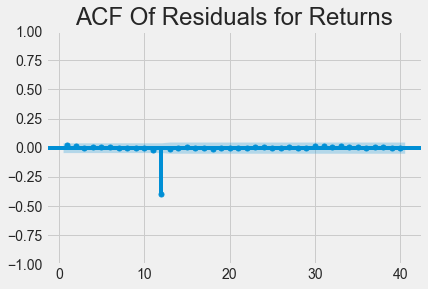

In [363]:
plot_acf(model_residual, zero = False, lags = 40)
plt.title("ACF Of Residuals for Returns",size=24)
plt.show()

#### Residuals must be random

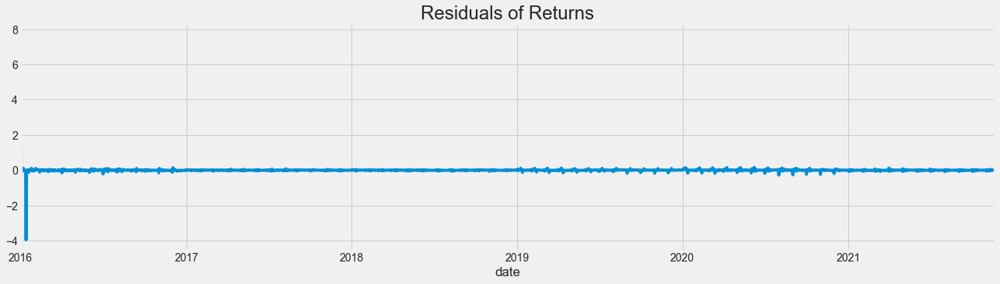

In [364]:
model_residual.plot(figsize=(20,5))
plt.title("Residuals of Returns", size=24)
plt.show()


#### Creating model with differente Transformation Technique

In [365]:
#Compareing the results 

Evaluation = {"Models":pd.Series(["Simple_Exponential","Double_Exponential","Triple_Exp_additive","Triple_Exp_mul_ad","Triple_Exp_ad_mul"\
                                  ,"Triple_Exp_multiplicative","ARIMA","SARIMA"]),\
        "MAPE(%)":pd.Series([mape_ses,mape_dexp,mape_ad_texp,mape_mul_ad_texp,mape_ad_mul_texp,mape_mul_texp,mape_arima,mape_sarima]),\
        "RMSE_Values":pd.Series([test_rmse_ses,test_rmse_dexp,test_rmse_ad_texp,test_rmse_mul_ad_texp,test_rmse_ad_mul_texp,test_rmse_mul_texp,rmse_ARIMA,rmse_SARIMA])}
table_evaluation=pd.DataFrame(Evaluation)
table_evaluation.sort_values(['RMSE_Values'], inplace=True, ignore_index=True)
table_evaluation


,Models,MAPE(%),RMSE_Values
0,SARIMA,1.790000,103.500000
1,Simple_Exponential,2.353934,127.392205
2,Double_Exponential,3.159215,155.387623
3,Triple_Exp_multiplicative,4.345981,236.467068
4,Triple_Exp_mul_ad,5.530815,281.839893
5,Triple_Exp_additive,8.792442,407.438925
6,Triple_Exp_ad_mul,21.785968,1059.576227
7,ARIMA,26.670000,1153.040000


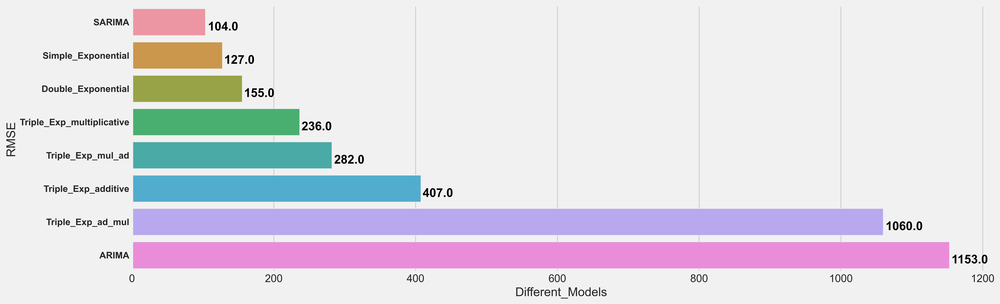

In [366]:
f, axe = plt.subplots(1,1, figsize=(18,6), dpi=500)
sns.barplot(x='RMSE_Values', y='Models', data=table_evaluation, ax = axe)
axe.set_xlabel('Different_Models', size=16)
axe.set_ylabel('RMSE', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=14)


for i, v in enumerate(np.round(table_evaluation.RMSE_Values.values,0)):
    axe.text(v + 3, i + .25, str(v),
            color = 'black', fontweight = 'bold', fontsize= 16)

plt.show()

#### Observation:
+ **The Sarima and double exponential Model did very well as compared to other Models but Holts-Winter Method did slightly better** 
**Note:Sarima with Hyperparameter tuning may get better results**
+ **Even in methods such as Triple Exponential Smoothing (Holts-Winters Method) taking Seasonality and Trend as Multiplicative gave the best restult in this case**

### Data Pre-processing for Model Driven Techniques

#### Creating Dummy Variables of the Categorical Feature Month of Date Time feature 

In [368]:
df2 = df1.copy()
df2.reset_index(inplace=True)
df2['t'] = np.arange(1,len(df2)+1)
df2['t_squared'] = np.square(df2.t)
df2["month"] = df2.date.dt.strftime("%b") # month extraction
df2["year"] = df2.date.dt.strftime("%Y") # year extraction
months = pd.get_dummies(df2['month'])
months = months[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']]
df2 = pd.concat([df2,months],axis=1)
df2['log_price'] = np.log(df2['price'])
df2

,date,price,t,t_squared,month,year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,log_price
0,2016-01-01,2252.60,1,1,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.719840
1,2016-01-02,2454.50,2,4,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.805678
2,2016-01-03,2708.10,3,9,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.904003
3,2016-01-04,2577.80,4,16,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.854692
4,2016-01-05,2597.75,5,25,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.862401
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2177,2021-12-17,4394.40,2178,4743684,Dec,2021,0,0,0,0,0,0,0,0,0,0,0,1,8.388086
2178,2021-12-18,4389.50,2179,4748041,Dec,2021,0,0,0,0,0,0,0,0,0,0,0,1,8.386971
2179,2021-12-19,4389.50,2180,4752400,Dec,2021,0,0,0,0,0,0,0,0,0,0,0,1,8.386971
2180,2021-12-20,4354.10,2181,4756761,Dec,2021,0,0,0,0,0,0,0,0,0,0,0,1,8.378873


#### Splitting data into Train and Test 

In [369]:
train_data = df2.iloc[:size]
test_data = df2.iloc[size:]

In [370]:
train_data

,date,price,t,t_squared,month,year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,log_price
0,2016-01-01,2252.60,1,1,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.719840
1,2016-01-02,2454.50,2,4,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.805678
2,2016-01-03,2708.10,3,9,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.904003
3,2016-01-04,2577.80,4,16,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.854692
4,2016-01-05,2597.75,5,25,Jan,2016,1,0,0,0,0,0,0,0,0,0,0,0,7.862401
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2147,2021-11-17,4443.80,2148,4613904,Nov,2021,0,0,0,0,0,0,0,0,0,0,1,0,8.399265
2148,2021-11-18,4423.30,2149,4618201,Nov,2021,0,0,0,0,0,0,0,0,0,0,1,0,8.394641
2149,2021-11-19,4410.10,2150,4622500,Nov,2021,0,0,0,0,0,0,0,0,0,0,1,0,8.391653
2150,2021-11-20,4404.20,2151,4626801,Nov,2021,0,0,0,0,0,0,0,0,0,0,1,0,8.390314


In [371]:
test_data.shape

(30, 19)

### Building Ordinary Square Model (Linear Model)

In [372]:
#Linear Model
import statsmodels.formula.api as smf 

linear_model = smf.ols('price~t',data=train_data).fit()
pred_linear =  pd.Series(linear_model.predict(pd.DataFrame(test_data['t'])))
rmse_linear = np.sqrt(np.mean((np.array(test_data['price'])-np.array(pred_linear))**2))
rmse_linear

103.15443682194355

In [373]:
linear_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.773
Model:                            OLS   Adj. R-squared:                  0.773
Method:                 Least Squares   F-statistic:                     7309.
Date:                Sat, 24 Sep 2022   Prob (F-statistic):               0.00
Time:                        11:23:28   Log-Likelihood:                -15600.
No. Observations:                2152   AIC:                         3.120e+04
Df Residuals:                    2150   BIC:                         3.122e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2182.5315     14.688    148.589      0.000    2153.727    2211.336
t              1.0104      0.012     85.494      0.000       0.987       1.034
==============================================================================
Omnibus:                       80.373   Durbin-Watson:                   0.113
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               75.113
Skew:                           0.407   Prob(JB):                     4.89e-17
Kurtosis:                       2.582   Cond. No.                     2.49e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.49e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### Model Evaluation

In [374]:
y_pred=linear_model.predict(test_data)
y_pred.head()

2152    4357.831116
2153    4358.841474
2154    4359.851831
2155    4360.862189
2156    4361.872546
dtype: float64

In [375]:
y_test=test_data.iloc[:,1]
y_test.head()

2152    4311.2
2153    4275.0
2154    4273.5
2155    4278.3
2156    4315.7
Name: price, dtype: float64

In [376]:
res8=y_pred-y_test
res8

2152     46.631116
2153     83.841474
2154     86.351831
2155     82.562189
2156     46.172546
2157     43.982904
2158     44.993261
2159     61.003619
2160     88.913976
2161     13.724333
2162    129.834691
2163    351.845048
2164    199.555406
2165     65.465763
2166    -41.623879
2167     53.586478
2168    192.496836
2169    155.607193
2170    111.317551
2171    -71.872092
2172     44.538265
2173     27.648623
2174     51.858980
2175     32.369338
2176    -17.720305
2177    -11.309947
2178     -5.399590
2179     -4.389232
2180     32.021125
2181     40.631482
dtype: float64

<AxesSubplot:ylabel='Frequency'>

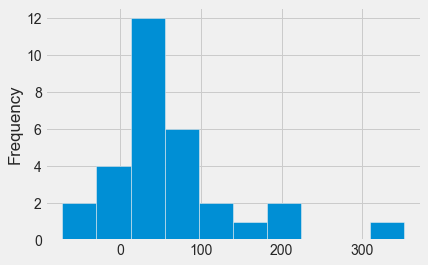

In [377]:
res8.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

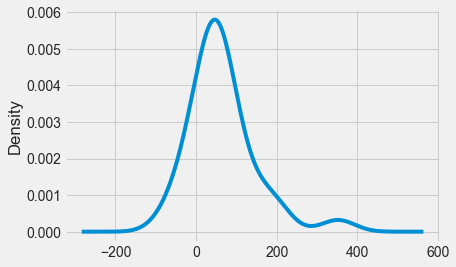

In [378]:
res8.plot(kind='kde')

In [379]:
res8.describe()

count     30.000000
mean      64.487966
std       81.888107
min      -71.872092
25%       28.741748
50%       46.401831
75%       85.724242
max      351.845048
dtype: float64

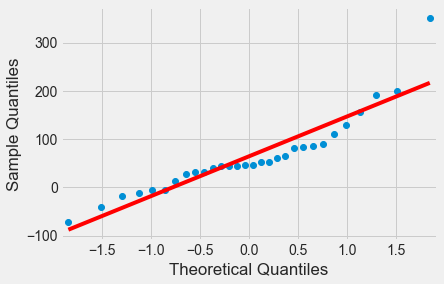

In [380]:
import statsmodels.api as smf
smf.qqplot(res8,line='r')
plt.show()

In [381]:
#Exponential
import statsmodels.formula.api as smf 
Exp = smf.ols('log_price~t',data=train_data).fit()
pred_Exp = pd.Series(Exp.predict(pd.DataFrame(test_data['t'])))
rmse_Exp = np.sqrt(np.mean((np.array(test_data['price'])-np.array(np.exp(pred_Exp)))**2))
rmse_Exp

144.41640747448696

In [382]:
Exp.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.794
Model:                            OLS   Adj. R-squared:                  0.794
Method:                 Least Squares   F-statistic:                     8310.
Date:                Sat, 24 Sep 2022   Prob (F-statistic):               0.00
Time:                        11:23:32   Log-Likelihood:                 2028.1
No. Observations:                2152   AIC:                            -4052.
Df Residuals:                    2150   BIC:                            -4041.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.7490      0.004   1904.676      0.000       7.741       7.757
t              0.0003   3.27e-06     91.157      0.000       0.000       0.000
==============================================================================
Omnibus:                      110.950   Durbin-Watson:                   0.116
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               77.170
Skew:                           0.354   Prob(JB):                     1.75e-17
Kurtosis:                       2.400   Cond. No.                     2.49e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.49e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [383]:
#Quadratic 

Quad = smf.ols('price~t+t_squared',data=train_data).fit()
pred_Quad = pd.Series(Quad.predict(test_data[["t","t_squared"]]))
rmse_Quad = np.sqrt(np.mean((np.array(test_data['price'])-np.array(pred_Quad))**2))
rmse_Quad

533.9441755135559

In [384]:
Quad.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.850
Model:                            OLS   Adj. R-squared:                  0.850
Method:                 Least Squares   F-statistic:                     6107.
Date:                Sat, 24 Sep 2022   Prob (F-statistic):               0.00
Time:                        11:23:33   Log-Likelihood:                -15150.
No. Observations:                2152   AIC:                         3.031e+04
Df Residuals:                    2149   BIC:                         3.032e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2628.0996     17.891    146.895      0.000    2593.014    2663.185
t             -0.2308      0.038     -6.013      0.000      -0.306      -0.156
t_squared      0.0006   1.73e-05     33.397      0.000       0.001       0.001
==============================================================================
Omnibus:                      375.786   Durbin-Watson:                   0.171
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              720.982
Skew:                           1.058   Prob(JB):                    2.76e-157
Kurtosis:                       4.889   Cond. No.                     6.22e+06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.22e+06. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

### Model Evaluation

In [385]:
y_pred=Exp.predict(test_data)
y_pred.head()

2152    8.391461
2153    8.391759
2154    8.392058
2155    8.392356
2156    8.392654
dtype: float64

In [386]:
y_test=test_data.iloc[:,-1]
y_test.head()

2152    8.368972
2153    8.360539
2154    8.360188
2155    8.361311
2156    8.370015
Name: log_price, dtype: float64

In [387]:
res9=y_pred-y_test
res9

2152    0.022489
2153    0.031220
2154    0.031869
2155    0.031045
2156    0.022640
2157    0.022197
2158    0.022495
2159    0.026273
2160    0.032841
2161    0.015480
2162    0.042574
2163    0.096428
2164    0.059274
2165    0.027691
2166    0.003192
2167    0.025065
2168    0.057810
2169    0.049085
2170    0.038705
2171   -0.003282
2172    0.023298
2173    0.019474
2174    0.025118
2175    0.020692
2176    0.009308
2177    0.010834
2178    0.012248
2179    0.012547
2180    0.020943
2181    0.022988
dtype: float64

<AxesSubplot:ylabel='Frequency'>

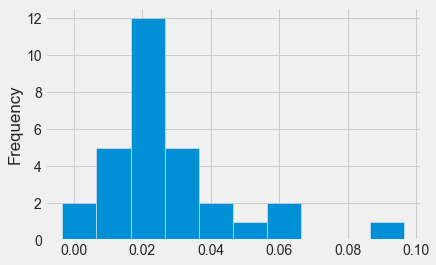

In [388]:
res9.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

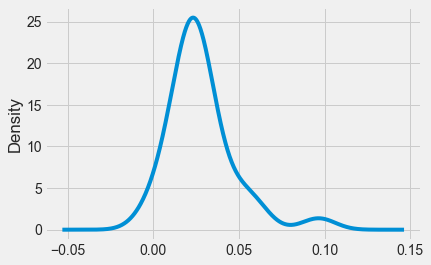

In [389]:
res9.plot(kind='kde')

In [390]:
res9.describe()

count    30.000000
mean      0.027751
std       0.019141
min      -0.003282
25%       0.019779
50%       0.023143
75%       0.031707
max       0.096428
dtype: float64

In [391]:
import statsmodels.api as sms

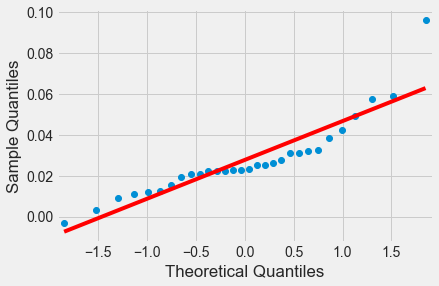

In [392]:
res9=np.array(res9)
sms.qqplot(res9,line='r')
plt.show()

In [393]:
#Additive seasonality 

add_sea = smf.ols('price~Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data=train_data).fit()
pred_add_sea = pd.Series(add_sea.predict(test_data[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']]))
rmse_add_sea = np.sqrt(np.mean((np.array(test_data['price'])-np.array(pred_add_sea))**2))
rmse_add_sea

1139.3462879731956

In [394]:
add_sea.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.404
Date:                Sat, 24 Sep 2022   Prob (F-statistic):            0.00579
Time:                        11:23:43   Log-Likelihood:                -17181.
No. Observations:                2152   AIC:                         3.439e+04
Df Residuals:                    2140   BIC:                         3.445e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3016.7569     14.181    212.733      0.000    2988.947    3044.567
Jan          149.0395     50.050      2.978      0.003      50.887     247.192
Feb          198.0746     52.172      3.797      0.000      95.762     300.387
Mar          161.6681     50.050      3.230      0.001      63.516     259.821
Apr          237.1090     50.812      4.666      0.000     137.463     336.755
May          253.6539     50.050      5.068      0.000     155.502     351.806
Jun          274.4206     50.812      5.401      0.000     174.775     374.066
Jul          309.5082     50.050      6.184      0.000     211.356     407.661
Aug          360.8106     50.050      7.209      0.000     262.658     458.963
Sep          342.8170     50.812      6.747      0.000     243.171     442.463
Oct          349.7835     50.050      6.989      0.000     251.631     447.936
Nov          270.2481     52.030      5.194      0.000     168.213     372.283
Dec          109.6237     54.459      2.013      0.044       2.825     216.422
==============================================================================
Omnibus:                     1733.689   Durbin-Watson:                   0.026
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              284.277
Skew:                           0.662   Prob(JB):                     1.86e-62
Kurtosis:                       1.810   Cond. No.                     1.16e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.73e-27. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [395]:
#Additive Seasonality Quadratic 

add_sea_Quad = smf.ols('price~t+t_squared+Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data=train_data).fit()
pred_add_sea_quad = pd.Series(add_sea_Quad.predict(test_data[['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec','t','t_squared']]))
rmse_add_sea_quad = np.sqrt(np.mean((np.array(test_data['price'])-np.array(pred_add_sea_quad))**2))
rmse_add_sea_quad

452.65306755256796

In [396]:
add_sea_Quad.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.854
Model:                            OLS   Adj. R-squared:                  0.853
Method:                 Least Squares   F-statistic:                     962.6
Date:                Sat, 24 Sep 2022   Prob (F-statistic):               0.00
Time:                        11:23:44   Log-Likelihood:                -15123.
No. Observations:                2152   AIC:                         3.027e+04
Df Residuals:                    2138   BIC:                         3.035e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2413.8700     16.485    146.430      0.000    2381.542    2446.198
t             -0.2090      0.038     -5.468      0.000      -0.284      -0.134
t_squared      0.0006   1.72e-05     33.127      0.000       0.001       0.001
Jan          233.1348     19.264     12.102      0.000     195.357     270.913
Feb          257.2386     20.075     12.814      0.000     217.869     296.608
Mar          193.4727     19.263     10.044      0.000     155.697     231.249
Apr          240.4422     19.560     12.292      0.000     202.083     278.801
May          227.4514     19.276     11.800      0.000     189.650     265.253
Jun          217.6296     19.579     11.116      0.000     179.234     256.025
Jul          221.0644     19.301     11.454      0.000     183.214     258.914
Aug          239.1133     19.318     12.378      0.000     201.230     276.997
Sep          187.3383     19.629      9.544      0.000     148.844     225.833
Oct          159.4589     19.362      8.236      0.000     121.489     197.428
Nov          115.9875     20.127      5.763      0.000      76.517     155.458
Dec          121.5384     21.178      5.739      0.000      80.007     163.070
==============================================================================
Omnibus:                      364.279   Durbin-Watson:                   0.174
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              654.894
Skew:                           1.060   Prob(JB):                    6.19e-143
Kurtosis:                       4.676   Cond. No.                     1.16e+22
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 6.92e-29. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

## Model Evaluation

In [397]:
y_pred=add_sea_Quad.predict(test_data)
y_pred.head()

2152    4717.277482
2153    4719.519000
2154    4721.761655
2155    4724.005448
2156    4726.250380
dtype: float64

In [398]:
y_test=test_data.iloc[:,1]
y_test.head()

2152    4311.2
2153    4275.0
2154    4273.5
2155    4278.3
2156    4315.7
Name: price, dtype: float64

In [399]:
res10=y_test-y_pred
res10

2152   -406.077482
2153   -444.519000
2154   -448.261655
2155   -445.705448
2156   -410.550380
2157   -409.596449
2158   -411.843655
2159   -429.092000
2160   -458.241483
2161   -389.842977
2162   -507.194735
2163   -730.447632
2164   -579.401666
2165   -446.556838
2166   -340.713149
2167   -437.170597
2168   -577.329183
2169   -541.688907
2170   -498.649769
2171   -316.711768
2172   -434.374906
2173   -418.739182
2174   -444.204595
2175   -425.971147
2176   -377.138836
2177   -384.807663
2178   -391.977629
2179   -394.248732
2180   -431.920973
2181   -441.794352
dtype: float64

<AxesSubplot:ylabel='Frequency'>

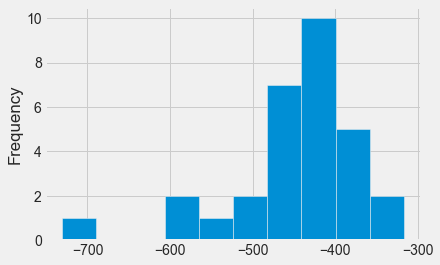

In [400]:
res10.plot(kind='hist')

<AxesSubplot:ylabel='Density'>

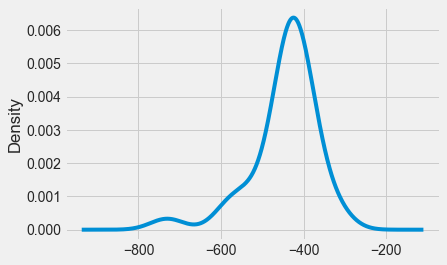

In [401]:
res10.plot(kind='kde')

In [402]:
res10.describe()

count     30.000000
mean    -445.825760
std       79.660000
min     -730.447632
25%     -447.835451
50%     -433.147939
75%     -406.957224
max     -316.711768
dtype: float64

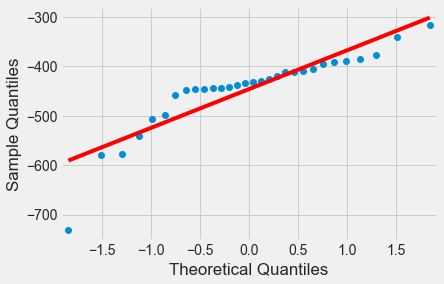

In [403]:
res10=np.array(res10)
sms.qqplot(res10,line='r')
plt.show()

In [404]:
##Multiplicative Seasonality

Mul_sea = smf.ols('log_price~Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data = train_data).fit()
pred_Mult_sea = pd.Series(Mul_sea.predict(test_data))
rmse_Mult_sea = np.sqrt(np.mean((np.array(test_data['price'])-np.array(np.exp(pred_Mult_sea)))**2))
rmse_Mult_sea

1206.4516308510765

In [405]:
Mul_sea.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     2.424
Date:                Sat, 24 Sep 2022   Prob (F-statistic):            0.00535
Time:                        11:23:49   Log-Likelihood:                 339.18
No. Observations:                2152   AIC:                            -654.4
Df Residuals:                    2140   BIC:                            -586.3
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.4489      0.004   1803.540      0.000       7.441       7.457
Jan            0.5892      0.015     40.418      0.000       0.561       0.618
Feb            0.6082      0.015     40.025      0.000       0.578       0.638
Mar            0.5968      0.015     40.943      0.000       0.568       0.625
Apr            0.6164      0.015     41.649      0.000       0.587       0.645
May            0.6200      0.015     42.533      0.000       0.591       0.649
Jun            0.6279      0.015     42.432      0.000       0.599       0.657
Jul            0.6362      0.015     43.644      0.000       0.608       0.665
Aug            0.6514      0.015     44.687      0.000       0.623       0.680
Sep            0.6490      0.015     43.854      0.000       0.620       0.678
Oct            0.6501      0.015     44.596      0.000       0.621       0.679
Nov            0.6261      0.015     41.316      0.000       0.596       0.656
Dec            0.5777      0.016     36.422      0.000       0.547       0.609
==============================================================================
Omnibus:                     7718.978   Durbin-Watson:                   0.024
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              264.392
Skew:                           0.555   Prob(JB):                     3.87e-58
Kurtosis:                       1.690   Cond. No.                     1.16e+15
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.73e-27. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [406]:
#Multiplicative Additive Seasonality 

Mul_Add_sea = smf.ols('log_price~t+Jan+Feb+Mar+Apr+May+Jun+Jul+Aug+Sep+Oct+Nov+Dec',data = train_data).fit()
pred_Mult_add_sea = pd.Series(Mul_Add_sea.predict(test_data))
rmse_Mult_add_sea = np.sqrt(np.mean((np.array(test_data['price'])-np.array(np.exp(pred_Mult_add_sea)))**2))
rmse_Mult_add_sea 

96.56019231165361

In [407]:
Mul_Add_sea.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              log_price   R-squared:                       0.801
Model:                            OLS   Adj. R-squared:                  0.800
Method:                 Least Squares   F-statistic:                     718.9
Date:                Sat, 24 Sep 2022   Prob (F-statistic):               0.00
Time:                        11:23:49   Log-Likelihood:                 2064.7
No. Observations:                2152   AIC:                            -4103.
Df Residuals:                    2139   BIC:                            -4030.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      7.1505      0.004   1916.630      0.000       7.143       7.158
t              0.0003   3.26e-06     92.163      0.000       0.000       0.000
Jan            0.6085      0.007     92.996      0.000       0.596       0.621
Feb            0.6192      0.007     90.823      0.000       0.606       0.633
Mar            0.5983      0.007     91.490      0.000       0.585       0.611
Apr            0.6087      0.007     91.673      0.000       0.596       0.622
May            0.6032      0.007     92.198      0.000       0.590       0.616
Jun            0.6019      0.007     90.586      0.000       0.589       0.615
Jul            0.6010      0.007     91.752      0.000       0.588       0.614
Aug            0.6069      0.007     92.557      0.000       0.594       0.620
Sep            0.5953      0.007     89.331      0.000       0.582       0.608
Oct            0.5873      0.007     89.322      0.000       0.574       0.600
Nov            0.5687      0.007     83.310      0.000       0.555       0.582
Dec            0.5514      0.007     77.434      0.000       0.537       0.565
==============================================================================
Omnibus:                      119.517   Durbin-Watson:                   0.118
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               81.869
Skew:                           0.365   Prob(JB):                     1.67e-18
Kurtosis:                       2.383   Cond. No.                     5.12e+18
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 1.27e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [408]:
np.exp(pred_Mult_add_sea)

2152    4297.479828
2153    4298.770623
2154    4300.061807
2155    4301.353378
2156    4302.645337
2157    4303.937685
2158    4305.230420
2159    4306.523544
2160    4307.817056
2161    4235.206199
2162    4236.478290
2163    4237.750764
2164    4239.023619
2165    4240.296857
2166    4241.570477
2167    4242.844480
2168    4244.118865
2169    4245.393634
2170    4246.668785
2171    4247.944319
2172    4249.220236
2173    4250.496537
2174    4251.773220
2175    4253.050288
2176    4254.327739
2177    4255.605573
2178    4256.883792
2179    4258.162394
2180    4259.441380
2181    4260.720751
dtype: float64

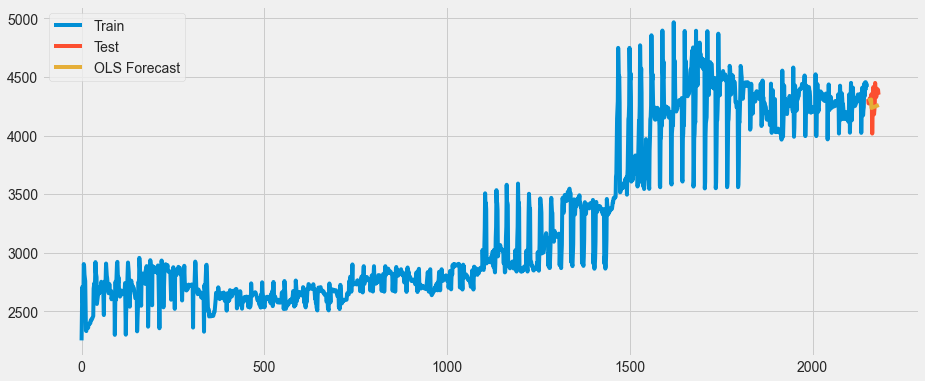

In [409]:
plt.figure(figsize=(14,6))
plt.plot(train_data['price'], label='Train')
plt.plot(test_data['price'], label='Test')
plt.plot(np.exp(pred_Mult_add_sea), label='OLS Forecast')
plt.legend(loc='best')
plt.show()

In [410]:
#Compare the results 

data = {"Models":pd.Series(["rmse_linear","rmse_Exp","rmse_Quad","rmse_add_sea","rmse_add_sea_quad","rmse_Mult_sea","rmse_Mult_add_sea"]),"RMSE_Values":pd.Series([rmse_linear,rmse_Exp,rmse_Quad,rmse_add_sea,rmse_add_sea_quad,rmse_Mult_sea,rmse_Mult_add_sea])}
table_rmse=pd.DataFrame(data)
table_rmse.sort_values(['RMSE_Values'], inplace=True, ignore_index=True)

In [411]:
e = table_rmse.append(table_evaluation)
e.drop('MAPE(%)', axis=1, inplace=True)
e.sort_values(['RMSE_Values'], inplace=True, ignore_index=True)


In [412]:
e

,Models,RMSE_Values
0,rmse_Mult_add_sea,96.560192
1,rmse_linear,103.154437
2,SARIMA,103.500000
3,Simple_Exponential,127.392205
4,rmse_Exp,144.416407
5,Double_Exponential,155.387623
6,Triple_Exp_multiplicative,236.467068
7,Triple_Exp_mul_ad,281.839893
8,Triple_Exp_additive,407.438925
9,rmse_add_sea_quad,452.653068


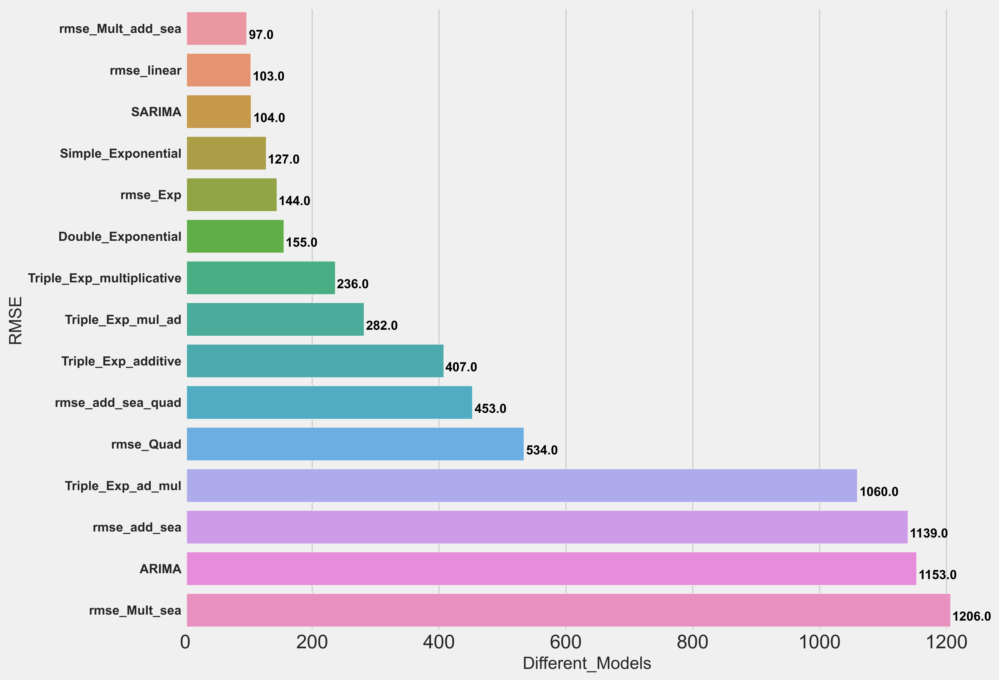

In [413]:
f, axe = plt.subplots(1,1, figsize=(12,10), dpi=500)
sns.barplot(x='RMSE_Values', y='Models', data=e, ax = axe)
axe.set_xlabel('Different_Models', size=16)
axe.set_ylabel('RMSE', size=16)
plt.yticks(fontsize=12,fontweight = 'bold')
plt.xticks(fontsize=18)

for i, v in enumerate(np.round(e.RMSE_Values.values,0)):
    axe.text(v + 3, i + .25, str(v),
            color = 'black', fontweight = 'bold', fontsize= 12)

plt.show()

# Conclusion:
## <p style="color:Green;font-size:18;">Double exponetial and Sarima</p><p style="color:red;font-size:14px;">The best model we have got so far with the lowest RMSE and lowest MAPE.</p>    

# Forcasting Using FB Prophet Model

In [414]:
df_prophet = pd.read_csv('Gold_data.csv')

In [431]:
df_prophet.head(3)

,date,price
0,2016-01-01,2252.6
1,2016-01-02,2454.5
2,2016-01-03,2708.1


In [441]:
df_prophet['date'] = pd.DatetimeIndex(df['date'])
df_prophet.dtypes

date     datetime64[ns]
price           float64
dtype: object

In [442]:
df2=df_prophet.copy()

In [443]:
df2 = df2.rename(columns={'date': 'ds',
                        'price': 'y'})

df2.head()

,ds,y
0,2016-01-01,2252.60
1,2016-01-02,2454.50
2,2016-01-03,2708.10
3,2016-01-04,2577.80
4,2016-01-05,2597.75


In [444]:
# set the uncertainty interval to 95% (the Prophet default is 80%)
my_model = Prophet(interval_width=0.95)
my_model.fit(df2)

cmd: where.exe tbb.dll
cwd: None
TBB already found in load path
Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
input tempfile: C:\Users\Admin\AppData\Local\Temp\tmpjw0gywes\0i75tdfh.json
input tempfile: C:\Users\Admin\AppData\Local\Temp\tmpjw0gywes\0mijr5te.json
idx 0
running CmdStan, num_threads: None
CmdStan args: ['C:\\Users\\Admin\\anaconda3\\Lib\\site-packages\\prophet\\stan_model\\prophet_model.bin', 'random', 'seed=43169', 'data', 'file=C:\\Users\\Admin\\AppData\\Local\\Temp\\tmpjw0gywes\\0i75tdfh.json', 'init=C:\\Users\\Admin\\AppData\\Local\\Temp\\tmpjw0gywes\\0mijr5te.json', 'output', 'file=C:\\Users\\Admin\\AppData\\Local\\Temp\\tmpjw0gywes\\prophet_modelunfld5in\\prophet_model-20220924115640.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
11:56:40 - cmdstanpy - INFO - Chain [1] start processing
Chain [1] start processing
11:56:45 - cmdstanpy - INFO - Chain [1] done processing
Chain [1] done processing


In [445]:
future_dates = my_model.make_future_dataframe(periods=30, freq='D')
future_dates.tail()

,ds
2207,2022-01-16
2208,2022-01-17
2209,2022-01-18
2210,2022-01-19
2211,2022-01-20


In [446]:
forecast = my_model.predict(future_dates)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].head()

,ds,yhat,yhat_lower,yhat_upper
0,2016-01-01,2623.395652,2299.327741,2964.724330
1,2016-01-02,2633.716006,2293.304972,2948.716596
2,2016-01-03,2635.634134,2318.182550,2979.105192
3,2016-01-04,2640.654027,2307.808322,2976.640217
4,2016-01-05,2644.054482,2321.014982,2976.038908


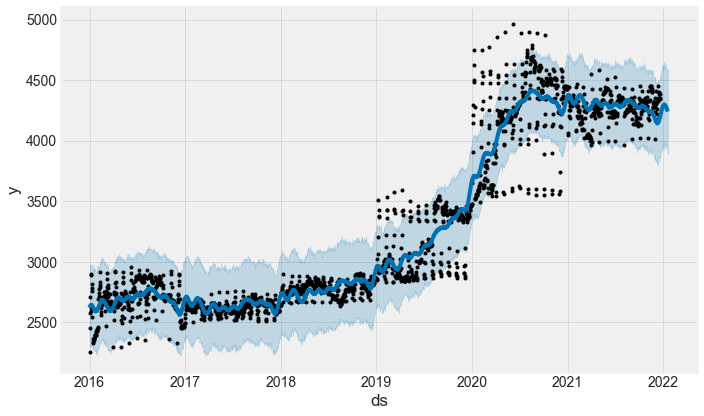

In [447]:
fig=my_model.plot(forecast, uncertainty=True)
fig.show()

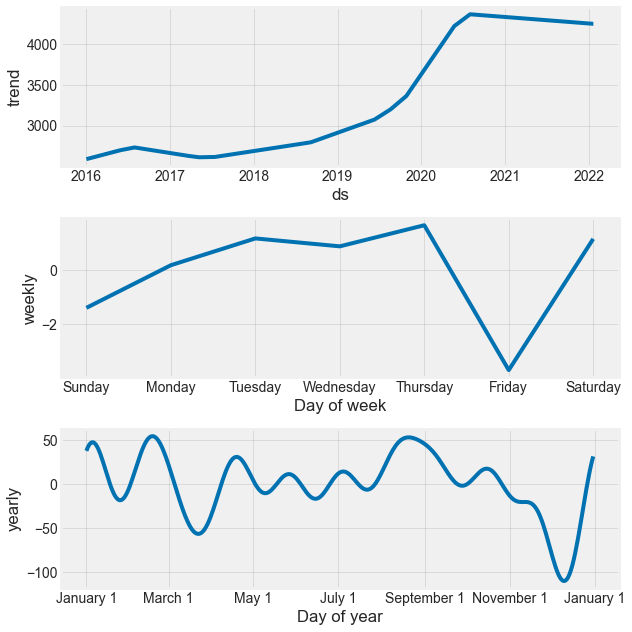

In [448]:
fig1=my_model.plot_components(forecast)
fig1.show()

In [449]:
forecast_for_30days=forecast[['ds','yhat']][-30:]
forecast_for_30days.set_index('ds',inplace=True)

In [450]:
forecast_for_30days

,yhat
ds,
2021-12-22,4209.910370
2021-12-23,4220.010323
2021-12-24,4224.023525
2021-12-25,4238.152779
2021-12-26,4244.635667
2021-12-27,4254.863028
2021-12-28,4263.987864
2021-12-29,4271.190363
2021-12-30,4278.717921
